<div style="border:solid blue 2px; padding: 20px">

**Overall Summary of the Project**

Hi Victor!

First of all, congratulations on completing this challenging project! 🚀 Your effort shows through your thorough data preparation, clear investigative analysis, and detailed explanations. You didn't just process the data — you really *thought* about the business problem behind it, which is exactly the kind of mindset we love to see.

---

**🌟 Strengths:**
    
- **Very strong data cleaning**: You correctly identified and handled missing values and zeros after careful investigation — not blindly — which is excellent practice!
- **Analytical depth**: You demonstrated critical thinking (especially your analysis of why some zeros might appear and how they propagate through the process).
- **Modeling approach**: You trained multiple models (Decision Tree, Random Forest, Linear Regression) and thoughtfully selected the best one based on sMAPE.
- **Code quality**: Your code was clear, structured, and well-commented, making it easy to follow.
- **Visual exploration**: You used graphs effectively to explore the data distributions and validate your hypotheses.
- **Professional storytelling**: You explained your findings like a true Data Scientist, connecting data patterns to the real industrial process.

---

**✅ No critical issues. Your project meets all the requirements for approval!**

---

**✏️ Optional Suggestions for Improvement:**
- **Even better modeling**: You could experiment with feature scaling or using Gradient Boosting Regressors next time to see if performance improves slightly over Random Forests.
- **Optimization**: When filling missing values, consider using `SimpleImputer` from `sklearn` for even cleaner pipelines instead of manual loops.

---

Victor, your project was a joy to review. You showed true ownership of the work — not just running code, but making informed decisions based on exploration and logic. Keep nurturing that mindset! You're developing the skills that make a real difference between a good Data Scientist and a *great* one.

Keep going strong, Victor! 🚀 You should be very proud of your work here.

---

# Project 10 - Intergrated Project 2 - Zyfra Gold Mining Predictions

The purpose of this project is to use Machine Learning to predict the amount of pure gold that can be mined from gold ore.
___

<img src="https://media.tenor.com/6X4PE34v4NYAAAAM/vegeta-dragon-ball.gif" alt="Alt text that describes the graphic" title="Title text" />

In [1]:
#all necessary imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
from collections import Counter
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import train_test_split

## Data Preparation

### Open files, observe and clean

In [2]:
#upload datasets

training_set = pd.read_csv('/datasets/gold_recovery_train.csv')
test_set = pd.read_csv('/datasets/gold_recovery_test.csv')
full_set = pd.read_csv('/datasets/gold_recovery_full.csv')

I will first take a look at each dataset

In [3]:
training_set

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16855,2018-08-18 06:59:59,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,...,23.031497,-501.167942,20.007571,-499.740028,18.006038,-499.834374,13.001114,-500.155694,20.007840,-501.296428
16856,2018-08-18 07:59:59,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,...,22.960095,-501.612783,20.035660,-500.251357,17.998535,-500.395178,12.954048,-499.895163,19.968498,-501.041608
16857,2018-08-18 08:59:59,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,...,23.015718,-501.711599,19.951231,-499.857027,18.019543,-500.451156,13.023431,-499.914391,19.990885,-501.518452
16858,2018-08-18 09:59:59,3.367241,11.625587,6.799433,46.408188,65.523246,8.777171,2.819214,10.463847,1.602879,...,23.024963,-501.153409,20.054122,-500.314711,17.979515,-499.272871,12.992404,-499.976268,20.013986,-500.625471


,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16855,2018-08-18 06:59:59,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,...,23.031497,-501.167942,20.007571,-499.740028,18.006038,-499.834374,13.001114,-500.155694,20.007840,-501.296428
16856,2018-08-18 07:59:59,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,...,22.960095,-501.612783,20.035660,-500.251357,17.998535,-500.395178,12.954048,-499.895163,19.968498,-501.041608
16857,2018-08-18 08:59:59,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,...,23.015718,-501.711599,19.951231,-499.857027,18.019543,-500.451156,13.023431,-499.914391,19.990885,-501.518452
16858,2018-08-18 09:59:59,3.367241,11.625587,6.799433,46.408188,65.523246,8.777171,2.819214,10.463847,1.602879,...,23.024963,-501.153409,20.054122,-500.314711,17.979515,-499.272871,12.992404,-499.976268,20.013986,-500.625471


In [4]:
training_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16860 entries, 0 to 16859
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                16860 non-null  object 
 1   final.output.concentrate_ag                         16788 non-null  float64
 2   final.output.concentrate_pb                         16788 non-null  float64
 3   final.output.concentrate_sol                        16490 non-null  float64
 4   final.output.concentrate_au                         16789 non-null  float64
 5   final.output.recovery                               15339 non-null  float64
 6   final.output.tail_ag                                16794 non-null  float64
 7   final.output.tail_pb                                16677 non-null  float64
 8   final.output.tail_sol                               16715 non-null  float64


___

In [5]:
test_set

,date,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,...,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
1,2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,...,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2,2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,...,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559
3,2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,...,12.033091,-498.350935,8.074946,-499.474407,7.897085,-500.868509,4.931400,-499.963623,24.948919,-498.709987
4,2016-09-01 04:59:59,199.099327,10.682530,7.530000,0.805575,1401.268123,-500.808305,1398.128818,-499.504543,1402.172226,...,12.025367,-500.786497,8.054678,-500.397500,8.107890,-509.526725,4.957674,-500.360026,25.003331,-500.856333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5851,2017-12-31 19:59:59,173.957757,15.963399,8.070000,0.896701,1401.930554,-499.728848,1401.441445,-499.193423,1399.810313,...,13.995957,-500.157454,12.069155,-499.673279,7.977259,-499.516126,5.933319,-499.965973,8.987171,-499.755909
5852,2017-12-31 20:59:59,172.910270,16.002605,8.070000,0.896519,1447.075722,-494.716823,1448.851892,-465.963026,1443.890424,...,16.749781,-496.031539,13.365371,-499.122723,9.288553,-496.892967,7.372897,-499.942956,8.986832,-499.903761
5853,2017-12-31 21:59:59,171.135718,15.993669,8.070000,1.165996,1498.836182,-501.770403,1499.572353,-495.516347,1502.749213,...,19.994130,-499.791312,15.101425,-499.936252,10.989181,-498.347898,9.020944,-500.040448,8.982038,-497.789882
5854,2017-12-31 22:59:59,179.697158,15.438979,8.070000,1.501068,1498.466243,-500.483984,1497.986986,-519.200340,1496.569047,...,19.958760,-499.958750,15.026853,-499.723143,11.011607,-499.985046,9.009783,-499.937902,9.012660,-500.154284


,date,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,...,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
1,2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,...,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2,2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,...,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559
3,2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,...,12.033091,-498.350935,8.074946,-499.474407,7.897085,-500.868509,4.931400,-499.963623,24.948919,-498.709987
4,2016-09-01 04:59:59,199.099327,10.682530,7.530000,0.805575,1401.268123,-500.808305,1398.128818,-499.504543,1402.172226,...,12.025367,-500.786497,8.054678,-500.397500,8.107890,-509.526725,4.957674,-500.360026,25.003331,-500.856333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5851,2017-12-31 19:59:59,173.957757,15.963399,8.070000,0.896701,1401.930554,-499.728848,1401.441445,-499.193423,1399.810313,...,13.995957,-500.157454,12.069155,-499.673279,7.977259,-499.516126,5.933319,-499.965973,8.987171,-499.755909
5852,2017-12-31 20:59:59,172.910270,16.002605,8.070000,0.896519,1447.075722,-494.716823,1448.851892,-465.963026,1443.890424,...,16.749781,-496.031539,13.365371,-499.122723,9.288553,-496.892967,7.372897,-499.942956,8.986832,-499.903761
5853,2017-12-31 21:59:59,171.135718,15.993669,8.070000,1.165996,1498.836182,-501.770403,1499.572353,-495.516347,1502.749213,...,19.994130,-499.791312,15.101425,-499.936252,10.989181,-498.347898,9.020944,-500.040448,8.982038,-497.789882
5854,2017-12-31 22:59:59,179.697158,15.438979,8.070000,1.501068,1498.466243,-500.483984,1497.986986,-519.200340,1496.569047,...,19.958760,-499.958750,15.026853,-499.723143,11.011607,-499.985046,9.009783,-499.937902,9.012660,-500.154284


In [6]:
test_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5856 entries, 0 to 5855
Data columns (total 53 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   date                                        5856 non-null   object 
 1   primary_cleaner.input.sulfate               5554 non-null   float64
 2   primary_cleaner.input.depressant            5572 non-null   float64
 3   primary_cleaner.input.feed_size             5856 non-null   float64
 4   primary_cleaner.input.xanthate              5690 non-null   float64
 5   primary_cleaner.state.floatbank8_a_air      5840 non-null   float64
 6   primary_cleaner.state.floatbank8_a_level    5840 non-null   float64
 7   primary_cleaner.state.floatbank8_b_air      5840 non-null   float64
 8   primary_cleaner.state.floatbank8_b_level    5840 non-null   float64
 9   primary_cleaner.state.floatbank8_c_air      5840 non-null   float64
 10  primary_clea

In [7]:
full_set

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22711,2018-08-18 06:59:59,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,...,23.031497,-501.167942,20.007571,-499.740028,18.006038,-499.834374,13.001114,-500.155694,20.007840,-501.296428
22712,2018-08-18 07:59:59,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,...,22.960095,-501.612783,20.035660,-500.251357,17.998535,-500.395178,12.954048,-499.895163,19.968498,-501.041608
22713,2018-08-18 08:59:59,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,...,23.015718,-501.711599,19.951231,-499.857027,18.019543,-500.451156,13.023431,-499.914391,19.990885,-501.518452
22714,2018-08-18 09:59:59,3.367241,11.625587,6.799433,46.408188,65.523246,8.777171,2.819214,10.463847,1.602879,...,23.024963,-501.153409,20.054122,-500.314711,17.979515,-499.272871,12.992404,-499.976268,20.013986,-500.625471


,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22711,2018-08-18 06:59:59,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,...,23.031497,-501.167942,20.007571,-499.740028,18.006038,-499.834374,13.001114,-500.155694,20.007840,-501.296428
22712,2018-08-18 07:59:59,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,...,22.960095,-501.612783,20.035660,-500.251357,17.998535,-500.395178,12.954048,-499.895163,19.968498,-501.041608
22713,2018-08-18 08:59:59,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,...,23.015718,-501.711599,19.951231,-499.857027,18.019543,-500.451156,13.023431,-499.914391,19.990885,-501.518452
22714,2018-08-18 09:59:59,3.367241,11.625587,6.799433,46.408188,65.523246,8.777171,2.819214,10.463847,1.602879,...,23.024963,-501.153409,20.054122,-500.314711,17.979515,-499.272871,12.992404,-499.976268,20.013986,-500.625471


In [8]:
full_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22716 entries, 0 to 22715
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                22716 non-null  object 
 1   final.output.concentrate_ag                         22627 non-null  float64
 2   final.output.concentrate_pb                         22629 non-null  float64
 3   final.output.concentrate_sol                        22331 non-null  float64
 4   final.output.concentrate_au                         22630 non-null  float64
 5   final.output.recovery                               20753 non-null  float64
 6   final.output.tail_ag                                22633 non-null  float64
 7   final.output.tail_pb                                22516 non-null  float64
 8   final.output.tail_sol                               22445 non-null  float64


First things first, lets convert the dat columns to date time types. Always makes things easier

In [9]:
training_set['date'] = pd.to_datetime(training_set['date'], format='%Y-%m-%d %H:%M:%S')
test_set['date'] = pd.to_datetime(test_set['date'], format='%Y-%m-%d %H:%M:%S')
full_set['date'] = pd.to_datetime(full_set['date'], format='%Y-%m-%d %H:%M:%S')

In [10]:
training_set.info()
test_set.info()
full_set.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16860 entries, 0 to 16859
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype         
---  ------                                              --------------  -----         
 0   date                                                16860 non-null  datetime64[ns]
 1   final.output.concentrate_ag                         16788 non-null  float64       
 2   final.output.concentrate_pb                         16788 non-null  float64       
 3   final.output.concentrate_sol                        16490 non-null  float64       
 4   final.output.concentrate_au                         16789 non-null  float64       
 5   final.output.recovery                               15339 non-null  float64       
 6   final.output.tail_ag                                16794 non-null  float64       
 7   final.output.tail_pb                                16677 non-null  float64       
 8   final.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16860 entries, 0 to 16859
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype         
---  ------                                              --------------  -----         
 0   date                                                16860 non-null  datetime64[ns]
 1   final.output.concentrate_ag                         16788 non-null  float64       
 2   final.output.concentrate_pb                         16788 non-null  float64       
 3   final.output.concentrate_sol                        16490 non-null  float64       
 4   final.output.concentrate_au                         16789 non-null  float64       
 5   final.output.recovery                               15339 non-null  float64       
 6   final.output.tail_ag                                16794 non-null  float64       
 7   final.output.tail_pb                                16677 non-null  float64       
 8   final.

Successfully changed!

### Checking if recovery is calculated correctly

Here I will create a function that calculates recovery

In [11]:
def check_recov(dataset):
    C = dataset['rougher.output.concentrate_au'] #assigning columns to variables
    F = dataset['rougher.input.feed_au']
    T = dataset['rougher.output.tail_au']
    recovery = ((C*(F - T))/(F*(C - T)))*100 #formula
    return recovery

In [12]:
calculated_recovery = check_recov(training_set) #applying function to training set and seeting resulting series to a variable
calculated_recovery

0        87.107763
1        86.843261
2        86.842308
3        87.226430
4        86.688794
           ...    
16855    89.574376
16856    87.724007
16857    88.890579
16858    89.858126
16859    89.514960
Length: 16860, dtype: float64

0        87.107763
1        86.843261
2        86.842308
3        87.226430
4        86.688794
           ...    
16855    89.574376
16856    87.724007
16857    88.890579
16858    89.858126
16859    89.514960
Length: 16860, dtype: float64

In [13]:
training_set['rougher.output.recovery'] #looking at list of recovery values from dataset

0        87.107763
1        86.843261
2        86.842308
3        87.226430
4        86.688794
           ...    
16855    89.574376
16856    87.724007
16857    88.890579
16858    89.858126
16859    89.514960
Name: rougher.output.recovery, Length: 16860, dtype: float64

0        87.107763
1        86.843261
2        86.842308
3        87.226430
4        86.688794
           ...    
16855    89.574376
16856    87.724007
16857    88.890579
16858    89.858126
16859    89.514960
Name: rougher.output.recovery, Length: 16860, dtype: float64

It appears that the values are the same, but to be sure, lets get boolean values to compare each

In [14]:
training_set['rougher.output.recovery'].values == calculated_recovery.values

array([ True, False, False, ..., False,  True, False])

array([ True, False, False, ..., False,  True, False])

By inspection, the values look equal, but some values are different according to python. Lets see the differences of the values. If they are different, the values should be non zero values

In [15]:
diff = training_set['rougher.output.recovery'] - calculated_recovery
diff

0        0.000000e+00
1       -1.421085e-14
2       -1.421085e-14
3        0.000000e+00
4        0.000000e+00
             ...     
16855    0.000000e+00
16856    0.000000e+00
16857    1.421085e-14
16858    0.000000e+00
16859    1.421085e-14
Length: 16860, dtype: float64

0        0.000000e+00
1       -1.421085e-14
2       -1.421085e-14
3        0.000000e+00
4        0.000000e+00
             ...     
16855    0.000000e+00
16856    0.000000e+00
16857    1.421085e-14
16858    0.000000e+00
16859    1.421085e-14
Length: 16860, dtype: float64

Understandably, python finds the slightest difference and says they are not the same. These differences are so infinitesimally small, they can be neglected. To assure that there are no values that are worth considering, I will take the sum of the values.

In [16]:
diff.sum() #summing the differences

2.3165913631828516e-12

2.3165913631828516e-12

With some positive and negative values added together, the sum is a mere 2 pico units. We can strongly conclude that the recovery was calculated correctly. Even so, I will calculate the mean absolute error for both lists of recoveries

In [17]:
#recov_mae = mean_absolute_error(training_set['rougher.output.recovery'], calculated_recovery) #calculating MAE using sklearn function
#recov_mae

In [18]:
def mae(l1, l2): #creating my own MAE function
    difference = l1 - l2
    absolute = abs(difference)
    total = absolute.sum()
    mean = total / len(l1)
    return mean

In [19]:
mae(training_set['rougher.output.recovery'], calculated_recovery)

7.883623897364653e-15

7.883623897364653e-15

The sklearn function for mean absolute error would not compute given than the lists have some missing values. Therefore, I created a function that calculated it myself. The mean absolute error is an even smaller 7.88 femto units. Both of these numbers are less than the length of an atom in meters. Very negligible

<img src="https://media0.giphy.com/media/O6nT9DSoiUVYQ/200w.gif?cid=6c09b952d06wjk06fvp1g0t28xnyhydnhumve52e1xa10w3k&ep=v1_gifs_search&rid=200w.gif&ct=g" alt="Alt text that describes the graphic" title="Title text" />

### Analyze features not available in test set

In [20]:
not_in_test = [] #empty list to append to
for q in training_set.columns: #for loop to check each column in the training set
    if q not in test_set.columns: #each column name will be checked if its not one of the test set columns
        not_in_test.append(q) #append column names that are not in test set

not_in_test #list of column names not in the test set

training_set[not_in_test] #df of columns that are not in the test set

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.output.concentrate_ag,...,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au
0,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,8.547551,...,19.793808,87.107763,5.008018,0.508728,19.154297,1.170244,14.500184,4.694824,8.764648,2.606185
1,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,8.558743,...,20.050975,86.843261,4.955378,0.536689,18.965234,1.184827,14.265474,4.592547,9.001494,2.488248
2,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,8.603505,...,19.737170,86.842308,4.843460,0.546416,18.808533,1.162562,14.115662,4.624775,8.842896,2.458187
3,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,7.221879,...,19.320810,87.226430,4.655288,0.542525,19.330200,1.079755,13.732071,4.482453,9.122857,2.322062
4,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,9.089428,...,19.216101,86.688794,4.552800,0.515438,19.267422,1.012642,14.079996,4.470737,8.871028,2.330448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16855,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,6.559174,...,18.603550,89.574376,4.207261,0.612935,16.666590,0.748633,0.000000,0.000000,0.000000,0.000000
16856,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,6.612376,...,18.441436,87.724007,4.177943,0.650557,16.960649,0.771582,0.000000,0.000000,0.000000,0.000000
16857,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,7.128896,...,15.111231,88.890579,4.050010,0.636095,18.323080,0.685059,0.000000,0.000000,0.000000,0.000000
16858,3.367241,11.625587,6.799433,46.408188,65.523246,8.777171,2.819214,10.463847,1.602879,7.490444,...,17.834772,89.858126,3.902494,0.625609,19.423740,0.567130,0.000000,0.000000,0.000000,0.000000


,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.output.concentrate_ag,...,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au
0,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,8.547551,...,19.793808,87.107763,5.008018,0.508728,19.154297,1.170244,14.500184,4.694824,8.764648,2.606185
1,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,8.558743,...,20.050975,86.843261,4.955378,0.536689,18.965234,1.184827,14.265474,4.592547,9.001494,2.488248
2,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,8.603505,...,19.737170,86.842308,4.843460,0.546416,18.808533,1.162562,14.115662,4.624775,8.842896,2.458187
3,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,7.221879,...,19.320810,87.226430,4.655288,0.542525,19.330200,1.079755,13.732071,4.482453,9.122857,2.322062
4,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,9.089428,...,19.216101,86.688794,4.552800,0.515438,19.267422,1.012642,14.079996,4.470737,8.871028,2.330448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16855,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,6.559174,...,18.603550,89.574376,4.207261,0.612935,16.666590,0.748633,0.000000,0.000000,0.000000,0.000000
16856,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,6.612376,...,18.441436,87.724007,4.177943,0.650557,16.960649,0.771582,0.000000,0.000000,0.000000,0.000000
16857,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,7.128896,...,15.111231,88.890579,4.050010,0.636095,18.323080,0.685059,0.000000,0.000000,0.000000,0.000000
16858,3.367241,11.625587,6.799433,46.408188,65.523246,8.777171,2.819214,10.463847,1.602879,7.490444,...,17.834772,89.858126,3.902494,0.625609,19.423740,0.567130,0.000000,0.000000,0.000000,0.000000


In [21]:
training_set[not_in_test].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16860 entries, 0 to 16859
Data columns (total 34 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   final.output.concentrate_ag                         16788 non-null  float64
 1   final.output.concentrate_pb                         16788 non-null  float64
 2   final.output.concentrate_sol                        16490 non-null  float64
 3   final.output.concentrate_au                         16789 non-null  float64
 4   final.output.recovery                               15339 non-null  float64
 5   final.output.tail_ag                                16794 non-null  float64
 6   final.output.tail_pb                                16677 non-null  float64
 7   final.output.tail_sol                               16715 non-null  float64
 8   final.output.tail_au                                16794 non-null  float64


It appears all the features not in the test set are all outputs of some kind. They are all float types.

### Data Preprocessing

Let's take a look at the distributions of each column's values because it appears every column has some missing.

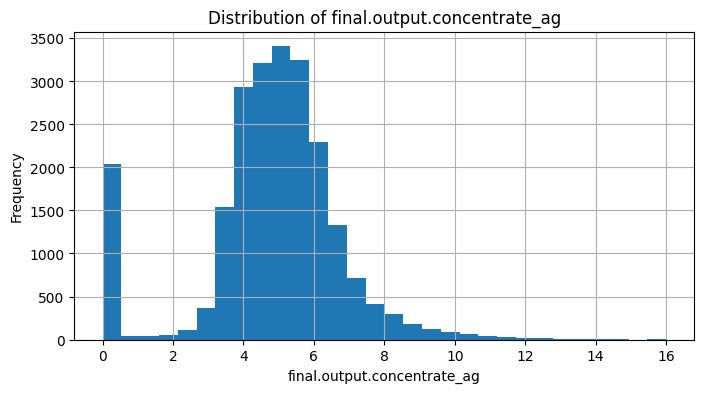

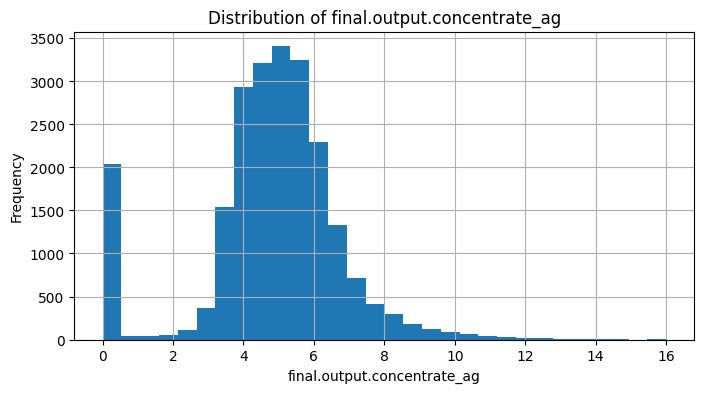

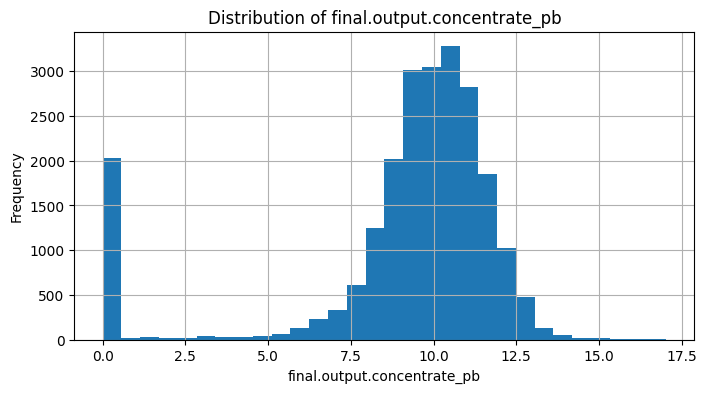

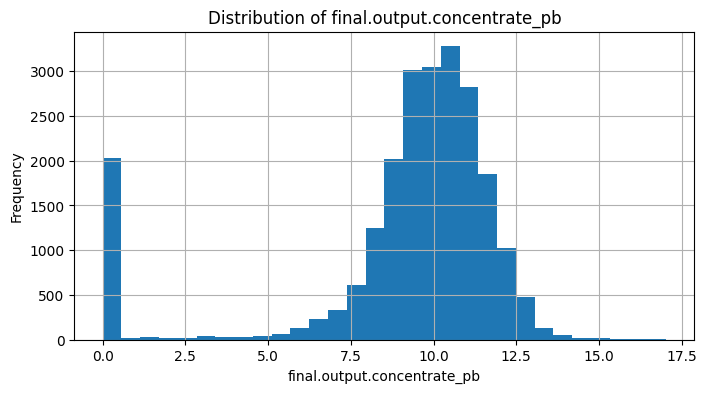

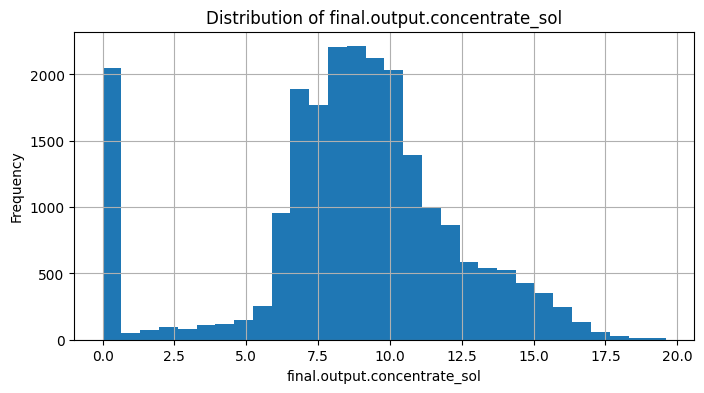

...

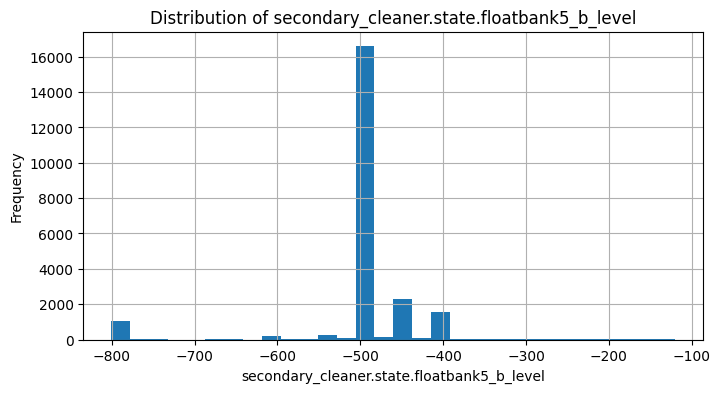

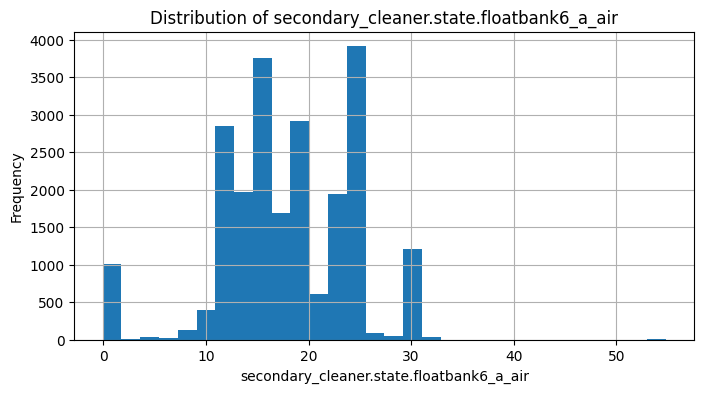

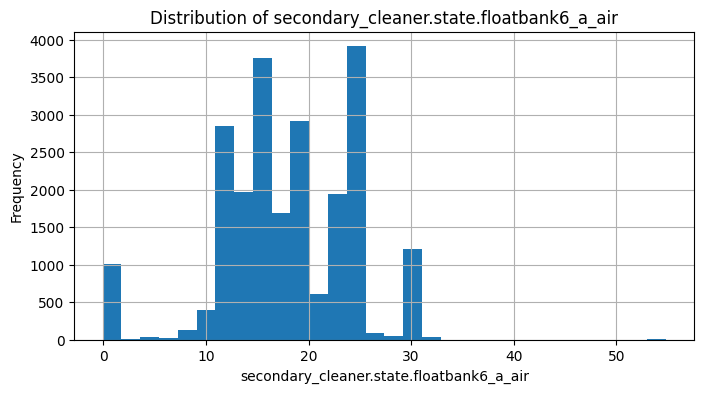

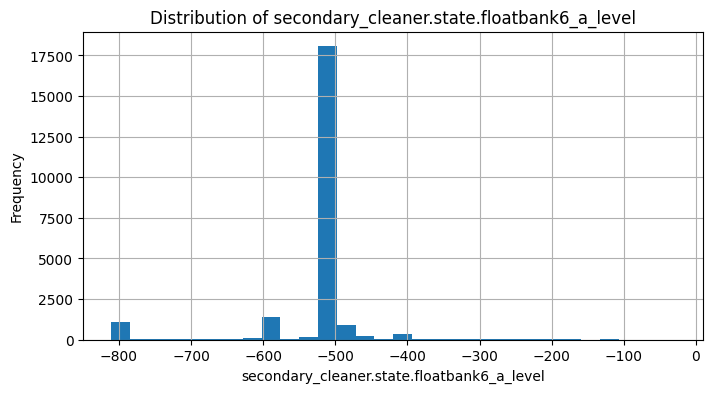

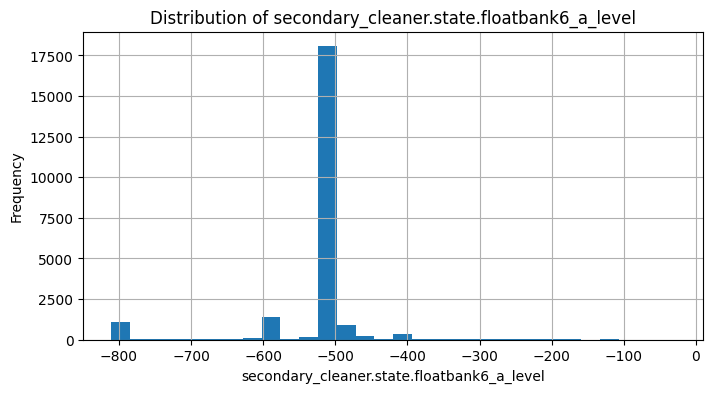

In [22]:
for column in full_set.select_dtypes(include='number').columns:
    plt.figure(figsize=(8, 4))
    full_set[column].hist(bins=30)
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

After scrolling through all of those graphs, I noticed a good portion of them have a substancial number of zeros. I want to investigate that further because that many zeros will severely affect the mean. I need to deduce if the zeros are significant or not. Here is a dataset of when the gold input has values of zero.

In [23]:
#filtered dataset for when the gold input is zero
au_zero_input = full_set[full_set['rougher.input.feed_au'] == 0]
au_zero_input

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
99,2016-01-19 03:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,13.985160,-799.601232,12.036072,-603.234250,9.974968,-497.092974,7.953962,-499.698442,11.941642,-598.541756
100,2016-01-19 04:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,14.034374,-799.600946,12.040491,-623.446329,9.898782,-499.623262,7.979302,-500.283366,11.959950,-600.998301
101,2016-01-19 05:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,13.943929,-799.600659,12.040238,-638.103348,9.956309,-499.791870,7.978806,-500.202026,11.987839,-600.302819
102,2016-01-19 06:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,14.040873,-799.600372,12.030771,-641.310327,9.966952,-499.842458,8.053455,-499.588522,11.987935,-600.523057
103,2016-01-19 07:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,13.972371,-799.600085,12.021058,-641.457227,10.033820,-501.291438,7.985956,-499.934267,12.027556,-600.108918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17908,2018-01-30 03:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,20.005303,-500.893527,14.922286,-500.230461,10.909829,-500.314837,9.007956,-500.153163,10.988968,-500.387261
17909,2018-01-30 04:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,19.962859,-655.489381,14.956567,-524.758657,10.961487,-500.066426,9.004925,-500.040902,10.961121,-500.023096
17910,2018-01-30 05:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,20.017100,-523.801393,15.013965,-499.995375,10.991333,-499.941268,9.062215,-499.992738,10.996987,-499.871678
17911,2018-01-30 06:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,19.947963,-521.792599,15.041185,-500.303435,10.980523,-500.095725,9.041985,-499.916563,11.010581,-500.083532


,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
99,2016-01-19 03:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,13.985160,-799.601232,12.036072,-603.234250,9.974968,-497.092974,7.953962,-499.698442,11.941642,-598.541756
100,2016-01-19 04:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,14.034374,-799.600946,12.040491,-623.446329,9.898782,-499.623262,7.979302,-500.283366,11.959950,-600.998301
101,2016-01-19 05:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,13.943929,-799.600659,12.040238,-638.103348,9.956309,-499.791870,7.978806,-500.202026,11.987839,-600.302819
102,2016-01-19 06:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,14.040873,-799.600372,12.030771,-641.310327,9.966952,-499.842458,8.053455,-499.588522,11.987935,-600.523057
103,2016-01-19 07:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,13.972371,-799.600085,12.021058,-641.457227,10.033820,-501.291438,7.985956,-499.934267,12.027556,-600.108918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17908,2018-01-30 03:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,20.005303,-500.893527,14.922286,-500.230461,10.909829,-500.314837,9.007956,-500.153163,10.988968,-500.387261
17909,2018-01-30 04:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,19.962859,-655.489381,14.956567,-524.758657,10.961487,-500.066426,9.004925,-500.040902,10.961121,-500.023096
17910,2018-01-30 05:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,20.017100,-523.801393,15.013965,-499.995375,10.991333,-499.941268,9.062215,-499.992738,10.996987,-499.871678
17911,2018-01-30 06:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,...,19.947963,-521.792599,15.041185,-500.303435,10.980523,-500.095725,9.041985,-499.916563,11.010581,-500.083532


This is also a very long dataset. To assist with pattern identifucation, I will make the index the datetimes. I could check if there are particular days or hours that have no input.

In [24]:
#changing indices to be the dates of records
full_set.set_index('date', inplace=True)

In [25]:
au_zero_input = full_set[full_set['rougher.input.feed_au'] == 0]
au_zero_input

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-01-19 03:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,2.116168,...,13.985160,-799.601232,12.036072,-603.234250,9.974968,-497.092974,7.953962,-499.698442,11.941642,-598.541756
2016-01-19 04:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,14.034374,-799.600946,12.040491,-623.446329,9.898782,-499.623262,7.979302,-500.283366,11.959950,-600.998301
2016-01-19 05:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,13.943929,-799.600659,12.040238,-638.103348,9.956309,-499.791870,7.978806,-500.202026,11.987839,-600.302819
2016-01-19 06:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,14.040873,-799.600372,12.030771,-641.310327,9.966952,-499.842458,8.053455,-499.588522,11.987935,-600.523057
2016-01-19 07:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,13.972371,-799.600085,12.021058,-641.457227,10.033820,-501.291438,7.985956,-499.934267,12.027556,-600.108918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-01-30 03:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,20.005303,-500.893527,14.922286,-500.230461,10.909829,-500.314837,9.007956,-500.153163,10.988968,-500.387261
2018-01-30 04:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,19.962859,-655.489381,14.956567,-524.758657,10.961487,-500.066426,9.004925,-500.040902,10.961121,-500.023096
2018-01-30 05:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,20.017100,-523.801393,15.013965,-499.995375,10.991333,-499.941268,9.062215,-499.992738,10.996987,-499.871678


,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-01-19 03:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,2.116168,...,13.985160,-799.601232,12.036072,-603.234250,9.974968,-497.092974,7.953962,-499.698442,11.941642,-598.541756
2016-01-19 04:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,14.034374,-799.600946,12.040491,-623.446329,9.898782,-499.623262,7.979302,-500.283366,11.959950,-600.998301
2016-01-19 05:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,13.943929,-799.600659,12.040238,-638.103348,9.956309,-499.791870,7.978806,-500.202026,11.987839,-600.302819
2016-01-19 06:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,14.040873,-799.600372,12.030771,-641.310327,9.966952,-499.842458,8.053455,-499.588522,11.987935,-600.523057
2016-01-19 07:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,13.972371,-799.600085,12.021058,-641.457227,10.033820,-501.291438,7.985956,-499.934267,12.027556,-600.108918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-01-30 03:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,20.005303,-500.893527,14.922286,-500.230461,10.909829,-500.314837,9.007956,-500.153163,10.988968,-500.387261
2018-01-30 04:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,19.962859,-655.489381,14.956567,-524.758657,10.961487,-500.066426,9.004925,-500.040902,10.961121,-500.023096
2018-01-30 05:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,20.017100,-523.801393,15.013965,-499.995375,10.991333,-499.941268,9.062215,-499.992738,10.996987,-499.871678


This wasn't too useful so far, I will try making a plot to notice any patterns of the zeros

Text(0, 0.5, 'Input Units')

Text(0, 0.5, 'Input Units')

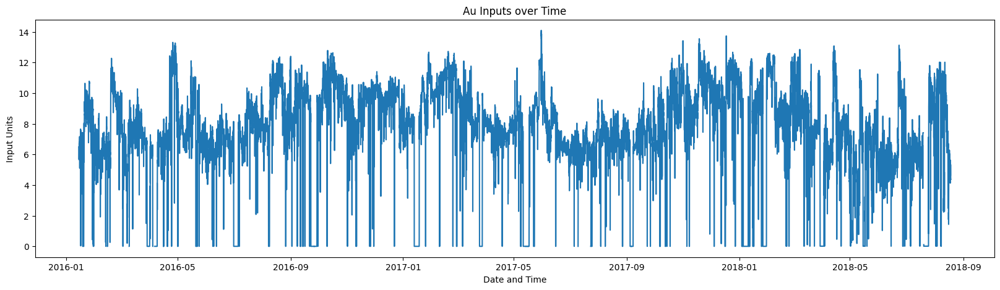

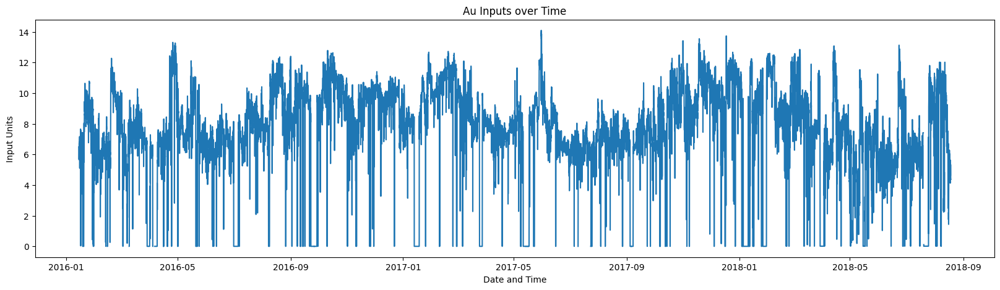

In [26]:
x_axis = full_set.index
y_axis = full_set['rougher.input.feed_au'] #specified the axes for my plot

plt.figure(figsize=[20,5]) #extending x dimension
plt.plot(x_axis, y_axis) #plotting with specified axes
plt.title('Au Inputs over Time') #giving title
plt.xlabel('Date and Time') #labeling x axis
plt.ylabel('Input Units') #labeling y axis

We can see that the graph dips down at certain dates, but there is so much going on in this graph, that it's nearly impossible to follow. Perhaps highlighting the zeros can help.

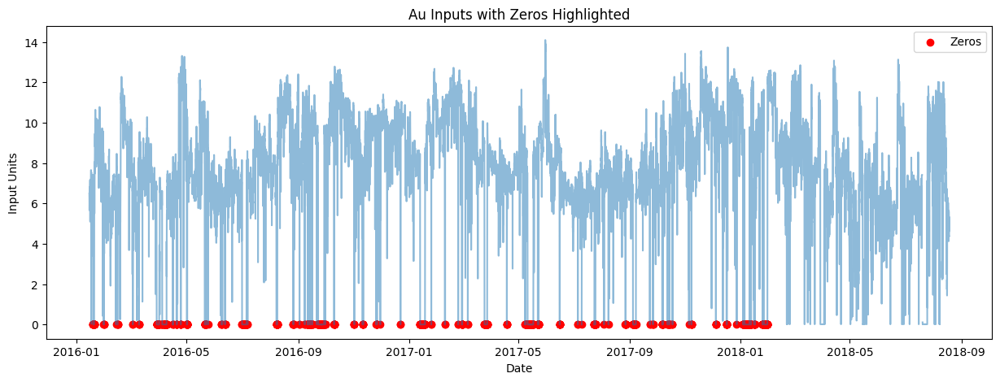

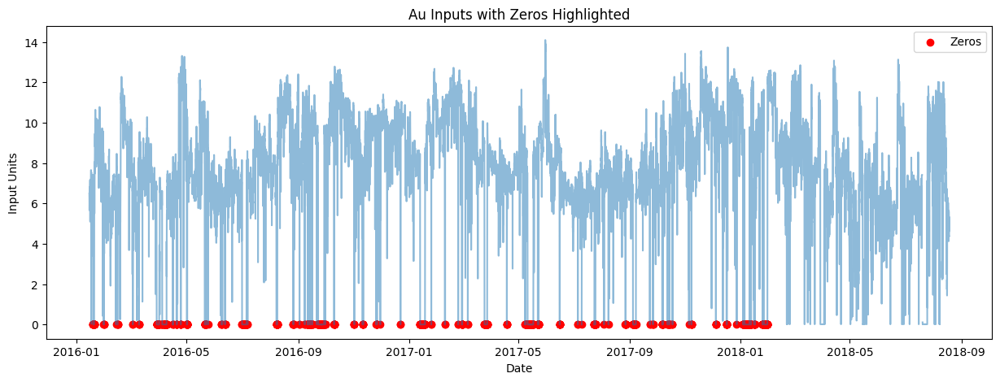

In [27]:
zeros = full_set[full_set['rougher.input.feed_au'] == 0] #filtering the zeros and assigning to a varible
plt.figure(figsize=(15,5))
plt.scatter(zeros.index, zeros['rougher.input.feed_au'], color='red', label='Zeros') #using scatterplot to locate points of zero and highlighting them red
plt.plot(x_axis, full_set['rougher.input.feed_au'], alpha=0.5) #dimming the majority of the plot
plt.title('Au Inputs with Zeros Highlighted')
plt.xlabel('Date')
plt.ylabel('Input Units')
plt.legend()
plt.show()

This wasn't too useful either. It's difficult to see a pattern. Next I will try to identify the specific dates that zero occurs to see

In [28]:
#creating a blank list and appending the indices to it to scan through them
blank = []
for s in au_zero_input.index :
    blank.append(s)

blank

[Timestamp('2016-01-19 03:00:00'),
 Timestamp('2016-01-19 04:00:00'),
 Timestamp('2016-01-19 05:00:00'),
 Timestamp('2016-01-19 06:00:00'),
 Timestamp('2016-01-19 07:00:00'),
 Timestamp('2016-01-19 08:00:00'),
 Timestamp('2016-01-19 09:00:00'),
 Timestamp('2016-01-19 10:00:00'),
 Timestamp('2016-01-19 11:00:00'),
 Timestamp('2016-01-19 12:00:00'),
 Timestamp('2016-01-19 13:00:00'),
 Timestamp('2016-01-19 14:00:00'),
 Timestamp('2016-01-19 15:00:00'),
 Timestamp('2016-01-19 16:00:00'),
 Timestamp('2016-01-19 17:00:00'),
 Timestamp('2016-01-19 18:00:00'),
 Timestamp('2016-01-19 19:00:00'),
 Timestamp('2016-01-19 20:00:00'),
 Timestamp('2016-01-19 21:00:00'),
 Timestamp('2016-01-19 22:00:00'),
 Timestamp('2016-01-19 23:00:00'),
 Timestamp('2016-01-20 00:00:00'),
 Timestamp('2016-01-20 01:00:00'),
 Timestamp('2016-01-20 02:00:00'),
 Timestamp('2016-01-20 03:00:00'),
 Timestamp('2016-01-20 04:00:00'),
 Timestamp('2016-01-20 05:00:00'),
 Timestamp('2016-01-20 06:00:00'),
 Timestamp('2016-01-

[Timestamp('2016-01-19 03:00:00'),
 Timestamp('2016-01-19 04:00:00'),
 Timestamp('2016-01-19 05:00:00'),
 Timestamp('2016-01-19 06:00:00'),
 Timestamp('2016-01-19 07:00:00'),
 Timestamp('2016-01-19 08:00:00'),
 Timestamp('2016-01-19 09:00:00'),
 Timestamp('2016-01-19 10:00:00'),
 Timestamp('2016-01-19 11:00:00'),
 Timestamp('2016-01-19 12:00:00'),
 Timestamp('2016-01-19 13:00:00'),
 Timestamp('2016-01-19 14:00:00'),
 Timestamp('2016-01-19 15:00:00'),
 Timestamp('2016-01-19 16:00:00'),
 Timestamp('2016-01-19 17:00:00'),
 Timestamp('2016-01-19 18:00:00'),
 Timestamp('2016-01-19 19:00:00'),
 Timestamp('2016-01-19 20:00:00'),
 Timestamp('2016-01-19 21:00:00'),
 Timestamp('2016-01-19 22:00:00'),
 Timestamp('2016-01-19 23:00:00'),
 Timestamp('2016-01-20 00:00:00'),
 Timestamp('2016-01-20 01:00:00'),
 Timestamp('2016-01-20 02:00:00'),
 Timestamp('2016-01-20 03:00:00'),
 Timestamp('2016-01-20 04:00:00'),
 Timestamp('2016-01-20 05:00:00'),
 Timestamp('2016-01-20 06:00:00'),
 Timestamp('2016-01-

It appears each date that occurs, does not have zeros at every hour. To count how many times a date occurs in this list, I will use a Counter function on the datetime series ignoring the hours.

In [29]:
date_counts = Counter(d.date() for d in au_zero_input.index) #created counter

for date, count in date_counts.items(): 
    print(f"{date}: {count}")

2016-01-19: 21
2016-01-20: 9
2016-01-30: 1
2016-01-31: 3
2016-02-13: 1
2016-02-15: 4
2016-03-02: 2
2016-03-09: 3
2016-03-29: 21
2016-03-30: 24
2016-03-31: 22
2016-04-04: 5
2016-04-06: 14
2016-04-07: 24
2016-04-08: 24
2016-04-09: 2
2016-04-15: 1
2016-04-16: 2
2016-04-20: 5
2016-04-24: 5
2016-05-01: 15
2016-05-20: 2
2016-05-21: 24
2016-05-22: 7
2016-05-24: 1
2016-06-08: 3
2016-06-09: 1
2016-06-12: 5
2016-07-01: 23
2016-07-02: 24
2016-07-03: 24
2016-07-04: 24
2016-07-05: 24
2016-07-07: 2
2016-08-07: 3
2016-08-08: 22
2016-08-26: 6
2016-09-02: 2
2016-09-08: 3
2016-09-11: 13
2016-09-13: 2
2016-09-14: 15
2016-09-16: 4
2016-09-21: 1
2016-09-22: 4
2016-09-23: 24
2016-09-24: 24
2016-09-25: 24
2016-09-26: 23
2016-09-27: 24
2016-09-28: 24
2016-09-29: 11
2016-09-30: 4
2016-10-10: 8
2016-11-01: 4
2016-11-10: 4
2016-11-11: 2
2016-11-25: 1
2016-11-26: 7
2016-11-30: 1
2016-12-22: 2
2017-01-13: 23
2017-01-14: 24
2017-01-15: 24
2017-01-16: 24
2017-01-17: 24
2017-01-18: 11
2017-01-25: 2
2017-02-09: 2
2017

In [30]:
date_counts

Counter({datetime.date(2016, 3, 30): 24,
         datetime.date(2016, 4, 7): 24,
         datetime.date(2016, 4, 8): 24,
         datetime.date(2016, 5, 21): 24,
         datetime.date(2016, 7, 2): 24,
         datetime.date(2016, 7, 3): 24,
         datetime.date(2016, 7, 4): 24,
         datetime.date(2016, 7, 5): 24,
         datetime.date(2016, 9, 23): 24,
         datetime.date(2016, 9, 24): 24,
         datetime.date(2016, 9, 25): 24,
         datetime.date(2016, 9, 27): 24,
         datetime.date(2016, 9, 28): 24,
         datetime.date(2017, 1, 14): 24,
         datetime.date(2017, 1, 15): 24,
         datetime.date(2017, 1, 16): 24,
         datetime.date(2017, 1, 17): 24,
         datetime.date(2017, 3, 25): 24,
         datetime.date(2017, 3, 26): 24,
         datetime.date(2017, 5, 12): 24,
         datetime.date(2017, 5, 13): 24,
         datetime.date(2017, 5, 15): 24,
         datetime.date(2017, 9, 6): 24,
         datetime.date(2018, 1, 6): 24,
         datetime.date(2

Counter({datetime.date(2016, 3, 30): 24,
         datetime.date(2016, 4, 7): 24,
         datetime.date(2016, 4, 8): 24,
         datetime.date(2016, 5, 21): 24,
         datetime.date(2016, 7, 2): 24,
         datetime.date(2016, 7, 3): 24,
         datetime.date(2016, 7, 4): 24,
         datetime.date(2016, 7, 5): 24,
         datetime.date(2016, 9, 23): 24,
         datetime.date(2016, 9, 24): 24,
         datetime.date(2016, 9, 25): 24,
         datetime.date(2016, 9, 27): 24,
         datetime.date(2016, 9, 28): 24,
         datetime.date(2017, 1, 14): 24,
         datetime.date(2017, 1, 15): 24,
         datetime.date(2017, 1, 16): 24,
         datetime.date(2017, 1, 17): 24,
         datetime.date(2017, 3, 25): 24,
         datetime.date(2017, 3, 26): 24,
         datetime.date(2017, 5, 12): 24,
         datetime.date(2017, 5, 13): 24,
         datetime.date(2017, 5, 15): 24,
         datetime.date(2017, 9, 6): 24,
         datetime.date(2018, 1, 6): 24,
         datetime.date(2

<div class="alert alert-block alert-info">

<span style="color:blue"> __Each count counts an hour of the day, therefore any count will not exceed 24. If 24, that means there were no inputs for the entire 24 hours of a day. Since any number from 1 through 24 occurs on this list, and I am unsure of the hours of operation for this company, I will only assume that days with 24 hours of no gold input were intentional. (i.e. a day off)__ </span>


From this, I also gathered that the recording of measurements for this flotation process must be automated given that some days have 24 hours of recording zero input.

Since the number of hours that have zero input vary, there isn't any pattern to follow. Each row represents a timestamp of the entire purification process. There are input and output measures at the exact same time. With that being said, a zero input value would trickle down the dataset at different columns at different times in a diagonal fashion. To delete a row with a zero input would not be best because it disregards the other values that came from other inputs at previous times.

I shall demonstrate below with Feb 13, 2016
</div>

In [31]:
#full set only showing rows from feb 13 2016
full_set.iloc[704:711]

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-02-13 08:00:00,8.811744,10.435322,7.067157,36.819726,66.878369,10.490010,1.390608,17.128816,2.451296,132.966593,...,22.017426,-400.512574,22.025899,-400.524390,23.013565,-400.015320,21.014146,-399.494393,24.927751,-398.926656
2016-02-13 09:00:00,2.927143,3.529820,2.603653,12.718924,75.033303,8.696086,1.161108,14.297571,1.830015,135.340047,...,21.995402,-399.783076,21.984020,-400.867343,23.040168,-402.986418,20.974829,-400.402069,24.959015,-399.878741
2016-02-13 10:00:00,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,134.891862,...,21.997624,-400.469261,21.973278,-398.058982,22.989873,-400.382826,20.990648,-400.126208,25.026524,-401.597490
2016-02-13 11:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,8.894029,0.843584,15.417342,1.779052,133.610147,...,21.991762,-399.587122,21.988937,-401.366408,22.995012,-399.370680,20.966863,-399.308354,24.987274,-399.619808
2016-02-13 12:00:00,2.980372,5.132350,2.909927,20.926771,69.361195,10.336389,1.022519,18.158869,2.264919,127.740684,...,21.990457,-399.795439,21.997449,-399.957415,23.015189,-400.043189,21.035117,-400.381290,24.999733,-399.327063
2016-02-13 13:00:00,2.638051,3.922281,NaN,14.549409,70.419728,8.155749,0.899750,13.391695,1.938436,114.685379,...,21.982691,-396.947427,22.037894,-393.192017,22.982370,-396.614987,20.970463,-399.602511,24.987362,-399.995130
2016-02-13 14:00:00,2.197605,3.372828,1.755950,12.350079,79.251828,10.510411,1.183940,17.690109,2.229120,116.815040,...,21.964657,-402.695487,22.064830,-402.861681,23.029056,-400.154249,21.014842,-399.702141,24.968849,-400.422017


,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-02-13 08:00:00,8.811744,10.435322,7.067157,36.819726,66.878369,10.490010,1.390608,17.128816,2.451296,132.966593,...,22.017426,-400.512574,22.025899,-400.524390,23.013565,-400.015320,21.014146,-399.494393,24.927751,-398.926656
2016-02-13 09:00:00,2.927143,3.529820,2.603653,12.718924,75.033303,8.696086,1.161108,14.297571,1.830015,135.340047,...,21.995402,-399.783076,21.984020,-400.867343,23.040168,-402.986418,20.974829,-400.402069,24.959015,-399.878741
2016-02-13 10:00:00,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,134.891862,...,21.997624,-400.469261,21.973278,-398.058982,22.989873,-400.382826,20.990648,-400.126208,25.026524,-401.597490
2016-02-13 11:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,8.894029,0.843584,15.417342,1.779052,133.610147,...,21.991762,-399.587122,21.988937,-401.366408,22.995012,-399.370680,20.966863,-399.308354,24.987274,-399.619808
2016-02-13 12:00:00,2.980372,5.132350,2.909927,20.926771,69.361195,10.336389,1.022519,18.158869,2.264919,127.740684,...,21.990457,-399.795439,21.997449,-399.957415,23.015189,-400.043189,21.035117,-400.381290,24.999733,-399.327063
2016-02-13 13:00:00,2.638051,3.922281,NaN,14.549409,70.419728,8.155749,0.899750,13.391695,1.938436,114.685379,...,21.982691,-396.947427,22.037894,-393.192017,22.982370,-396.614987,20.970463,-399.602511,24.987362,-399.995130
2016-02-13 14:00:00,2.197605,3.372828,1.755950,12.350079,79.251828,10.510411,1.183940,17.690109,2.229120,116.815040,...,21.964657,-402.695487,22.064830,-402.861681,23.029056,-400.154249,21.014842,-399.702141,24.968849,-400.422017


In [32]:
#full set filtered to only display the stages of measure of gold
full_set[['rougher.input.feed_au','rougher.output.tail_au','rougher.output.concentrate_au','primary_cleaner.output.tail_au','primary_cleaner.output.concentrate_au','secondary_cleaner.output.tail_au','final.output.concentrate_au']].iloc[704:711]

,rougher.input.feed_au,rougher.output.tail_au,rougher.output.concentrate_au,primary_cleaner.output.tail_au,primary_cleaner.output.concentrate_au,secondary_cleaner.output.tail_au,final.output.concentrate_au
date,,,,,,,
2016-02-13 08:00:00,6.523899,1.388750,16.944730,2.946343,29.882946,3.159593,36.819726
2016-02-13 09:00:00,5.117123,1.302030,12.815611,2.284353,27.902406,2.392689,12.718924
2016-02-13 10:00:00,0.000000,NaN,0.000000,0.039265,0.000000,0.063129,0.000000
2016-02-13 11:00:00,5.598971,2.293607,15.935190,1.965728,26.238846,2.283842,0.000000
2016-02-13 12:00:00,5.937530,2.721170,16.837133,1.941986,27.291117,2.309686,20.926771
2016-02-13 13:00:00,4.975147,2.860009,9.853011,1.969593,26.500821,2.271527,14.549409
2016-02-13 14:00:00,6.359342,1.709984,16.297189,2.247670,29.712634,2.694117,12.350079


,rougher.input.feed_au,rougher.output.tail_au,rougher.output.concentrate_au,primary_cleaner.output.tail_au,primary_cleaner.output.concentrate_au,secondary_cleaner.output.tail_au,final.output.concentrate_au
date,,,,,,,
2016-02-13 08:00:00,6.523899,1.388750,16.944730,2.946343,29.882946,3.159593,36.819726
2016-02-13 09:00:00,5.117123,1.302030,12.815611,2.284353,27.902406,2.392689,12.718924
2016-02-13 10:00:00,0.000000,NaN,0.000000,0.039265,0.000000,0.063129,0.000000
2016-02-13 11:00:00,5.598971,2.293607,15.935190,1.965728,26.238846,2.283842,0.000000
2016-02-13 12:00:00,5.937530,2.721170,16.837133,1.941986,27.291117,2.309686,20.926771
2016-02-13 13:00:00,4.975147,2.860009,9.853011,1.969593,26.500821,2.271527,14.549409
2016-02-13 14:00:00,6.359342,1.709984,16.297189,2.247670,29.712634,2.694117,12.350079


<div class="alert alert-block alert-info">
Above, you can see that at row 706, there was an input of zero, but there are non zero values at other stages in the process. There is also a zero as an output in the row below it yet there are input and other values.

The best way to eliminate the zeros would be to know how long the purification process takes. Then to delete the zeros that correspond at each time at each stage. That would then leave blanks in the dataset. The dataset would then need to be compressed so it doesn't have those values. But the times wouldn't align, so the rows would not be correct.

Because of this, I deem that to be too complex and difficult to accomplish. To progress with this project, I will delete every row with a zero gold input and output. This will allow me to properly fill in missing values by either using the mean or median, whichever is best per column. Besides, there are some rows that have all zeros in rows like below.
</div>

In [33]:
full_set[['rougher.input.feed_au','rougher.output.tail_au','rougher.output.concentrate_au','primary_cleaner.output.tail_au','primary_cleaner.output.concentrate_au','secondary_cleaner.output.tail_au','final.output.concentrate_au']].iloc[99:109]

,rougher.input.feed_au,rougher.output.tail_au,rougher.output.concentrate_au,primary_cleaner.output.tail_au,primary_cleaner.output.concentrate_au,secondary_cleaner.output.tail_au,final.output.concentrate_au
date,,,,,,,
2016-01-19 03:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 04:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 05:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 06:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 07:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 08:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 09:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 10:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 11:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0


,rougher.input.feed_au,rougher.output.tail_au,rougher.output.concentrate_au,primary_cleaner.output.tail_au,primary_cleaner.output.concentrate_au,secondary_cleaner.output.tail_au,final.output.concentrate_au
date,,,,,,,
2016-01-19 03:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 04:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 05:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 06:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 07:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 08:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 09:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 10:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0
2016-01-19 11:00:00,0.0,NaN,0.0,0.0,0.0,0.0,0.0


In [34]:
#assigning the dataset that has gold input values of zero to a variable
zero_input_au = full_set[full_set['rougher.input.feed_au'] == 0]
zero_input_au

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-01-19 03:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,2.116168,...,13.985160,-799.601232,12.036072,-603.234250,9.974968,-497.092974,7.953962,-499.698442,11.941642,-598.541756
2016-01-19 04:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,14.034374,-799.600946,12.040491,-623.446329,9.898782,-499.623262,7.979302,-500.283366,11.959950,-600.998301
2016-01-19 05:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,13.943929,-799.600659,12.040238,-638.103348,9.956309,-499.791870,7.978806,-500.202026,11.987839,-600.302819
2016-01-19 06:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,14.040873,-799.600372,12.030771,-641.310327,9.966952,-499.842458,8.053455,-499.588522,11.987935,-600.523057
2016-01-19 07:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,13.972371,-799.600085,12.021058,-641.457227,10.033820,-501.291438,7.985956,-499.934267,12.027556,-600.108918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-01-30 03:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,20.005303,-500.893527,14.922286,-500.230461,10.909829,-500.314837,9.007956,-500.153163,10.988968,-500.387261
2018-01-30 04:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,19.962859,-655.489381,14.956567,-524.758657,10.961487,-500.066426,9.004925,-500.040902,10.961121,-500.023096
2018-01-30 05:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,20.017100,-523.801393,15.013965,-499.995375,10.991333,-499.941268,9.062215,-499.992738,10.996987,-499.871678


,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-01-19 03:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,2.116168,...,13.985160,-799.601232,12.036072,-603.234250,9.974968,-497.092974,7.953962,-499.698442,11.941642,-598.541756
2016-01-19 04:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,14.034374,-799.600946,12.040491,-623.446329,9.898782,-499.623262,7.979302,-500.283366,11.959950,-600.998301
2016-01-19 05:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,13.943929,-799.600659,12.040238,-638.103348,9.956309,-499.791870,7.978806,-500.202026,11.987839,-600.302819
2016-01-19 06:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,14.040873,-799.600372,12.030771,-641.310327,9.966952,-499.842458,8.053455,-499.588522,11.987935,-600.523057
2016-01-19 07:00:00,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,13.972371,-799.600085,12.021058,-641.457227,10.033820,-501.291438,7.985956,-499.934267,12.027556,-600.108918
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-01-30 03:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,20.005303,-500.893527,14.922286,-500.230461,10.909829,-500.314837,9.007956,-500.153163,10.988968,-500.387261
2018-01-30 04:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,19.962859,-655.489381,14.956567,-524.758657,10.961487,-500.066426,9.004925,-500.040902,10.961121,-500.023096
2018-01-30 05:59:59,0.0,0.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0,NaN,...,20.017100,-523.801393,15.013965,-499.995375,10.991333,-499.941268,9.062215,-499.992738,10.996987,-499.871678


When I drop rows from the full set i need to be sure that the other datasets are losing their corresponding rows as well. So in addition to dropping from the full set directly, I'll run for loops to check if the rows being dropped are in the training and test sets. If they are, they will be dropped. If not, it will be ignored.

In [35]:
#need to change indices of training and test sets to the dates
training_set.set_index('date', inplace=True)
test_set.set_index('date', inplace=True)

In [36]:
#dropping rows using the index of dataset of zero gold input
full_set = full_set.drop(zero_input_au.index, axis=0)

for p in zero_input_au.index :
    if p in training_set.index :
        training_set = training_set.drop(p, axis=0)
for q in zero_input_au.index :    
    if q in test_set.index :
        test_set = test_set.drop(q, axis=0)

full_set

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,123.819808,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,122.270188,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,117.988169,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-18 06:59:59,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,123.381787,...,23.031497,-501.167942,20.007571,-499.740028,18.006038,-499.834374,13.001114,-500.155694,20.007840,-501.296428
2018-08-18 07:59:59,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,120.878188,...,22.960095,-501.612783,20.035660,-500.251357,17.998535,-500.395178,12.954048,-499.895163,19.968498,-501.041608
2018-08-18 08:59:59,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,105.666118,...,23.015718,-501.711599,19.951231,-499.857027,18.019543,-500.451156,13.023431,-499.914391,19.990885,-501.518452


,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,123.819808,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,122.270188,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,117.988169,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-18 06:59:59,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,123.381787,...,23.031497,-501.167942,20.007571,-499.740028,18.006038,-499.834374,13.001114,-500.155694,20.007840,-501.296428
2018-08-18 07:59:59,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,120.878188,...,22.960095,-501.612783,20.035660,-500.251357,17.998535,-500.395178,12.954048,-499.895163,19.968498,-501.041608
2018-08-18 08:59:59,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,105.666118,...,23.015718,-501.711599,19.951231,-499.857027,18.019543,-500.451156,13.023431,-499.914391,19.990885,-501.518452


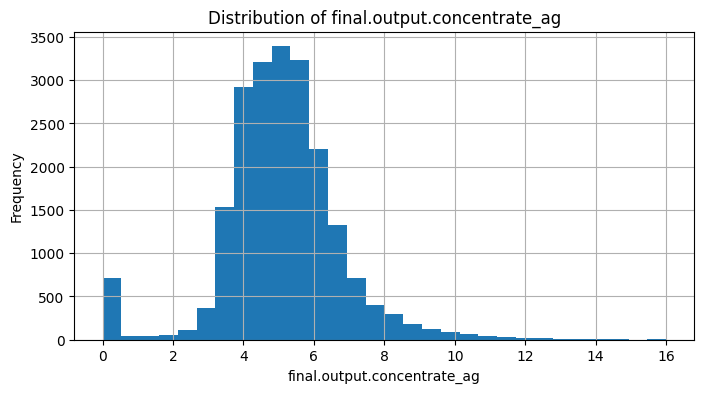

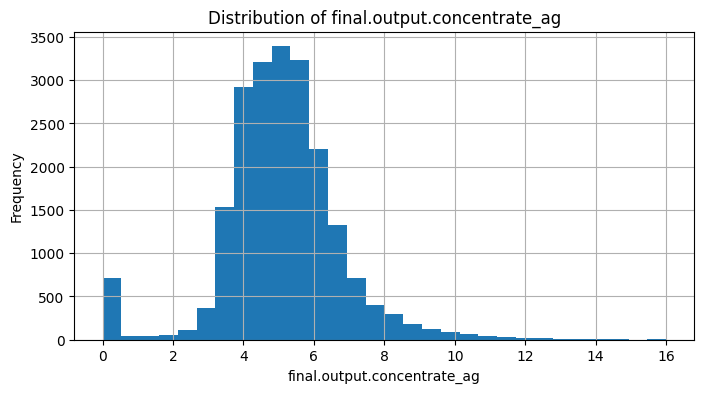

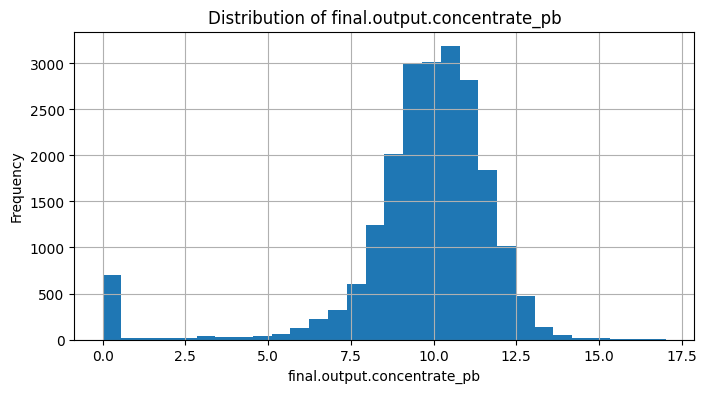

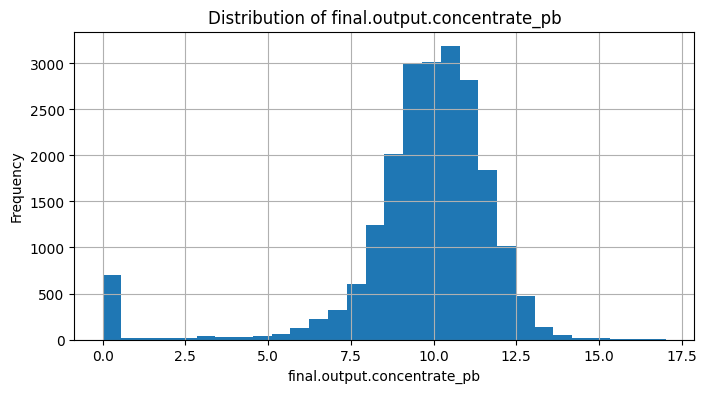

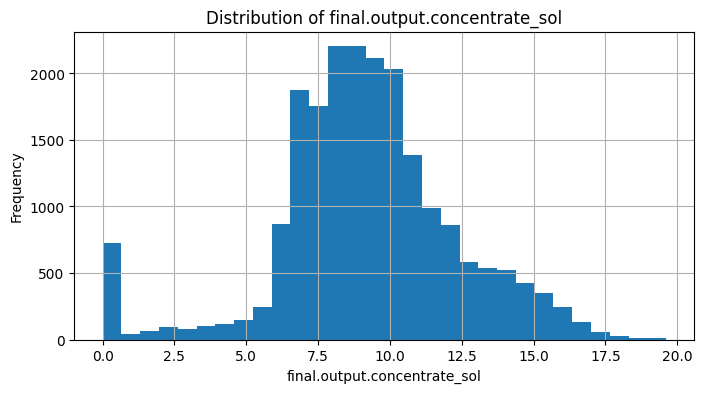

...

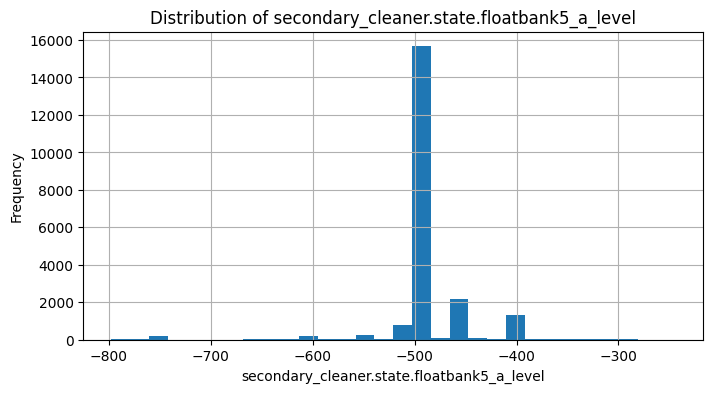

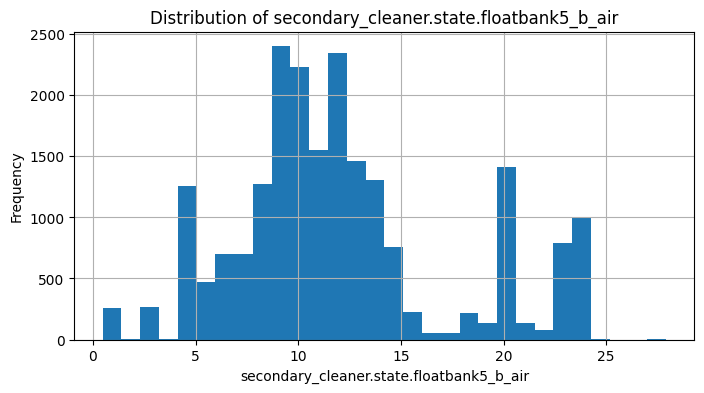

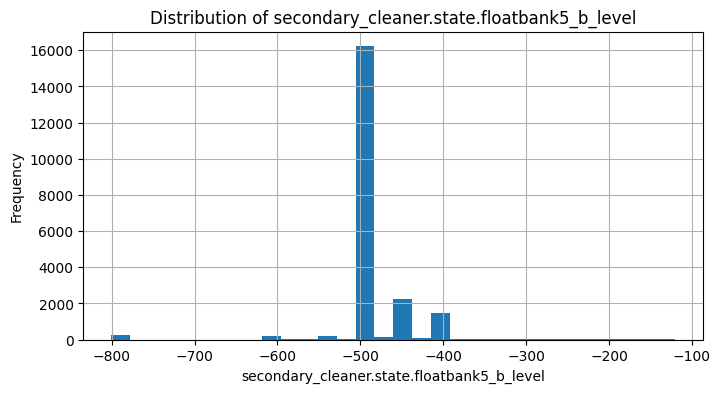

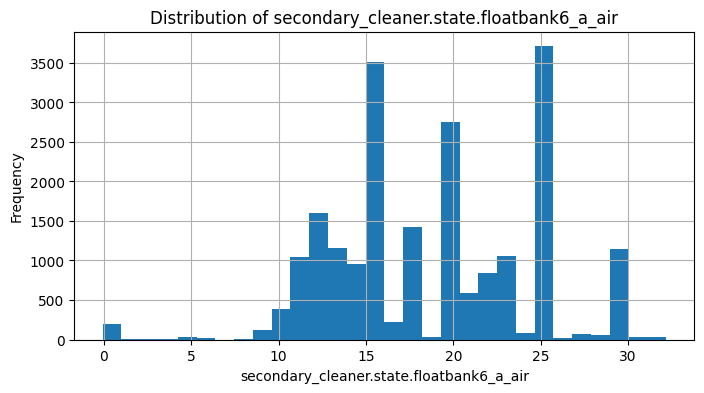

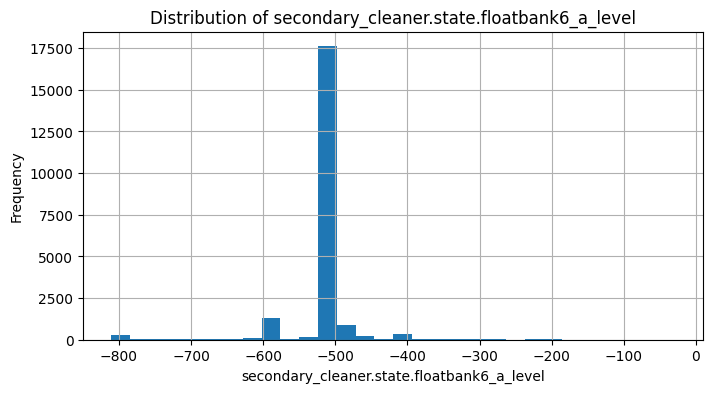

In [37]:
#checking progress
for column in full_set.select_dtypes(include='number').columns:
    plt.figure(figsize=(8, 4))
    full_set[column].hist(bins=30)
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

So there are still some gold outputs that are zero along with zero tail values. I'll rectify this

In [38]:
#assigning dataset that has gold output values of zero to variable
zero_output_au = full_set[full_set['final.output.concentrate_au'] == 0]
zero_output_au

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-01-20 09:00:00,0.0,0.0,0.0,0.0,NaN,0.000000,0.000000,0.000000,0.000000,8.584221,...,14.002423,-654.051206,12.054123,-553.770978,9.991036,-494.993322,7.976046,-500.127874,12.008321,-598.171229
2016-01-30 19:00:00,0.0,0.0,0.0,0.0,NaN,0.000000,0.000000,0.000000,0.000000,0.003140,...,15.033138,-500.829313,13.048598,-502.571546,13.976770,-499.653375,13.951932,-500.210713,15.974670,-500.697345
2016-01-30 20:00:00,0.0,0.0,0.0,0.0,NaN,0.000000,0.000000,0.000000,0.000000,3.734039,...,6.320044,-675.203696,9.111170,-549.573967,9.658130,-622.717599,10.020666,-499.120403,11.334154,-560.423845
2016-02-13 11:00:00,0.0,0.0,0.0,0.0,0.0,8.894029,0.843584,15.417342,1.779052,133.610147,...,21.991762,-399.587122,21.988937,-401.366408,22.995012,-399.370680,20.966863,-399.308354,24.987274,-399.619808
2016-02-17 22:00:00,0.0,0.0,0.0,0.0,0.0,12.212187,1.547021,NaN,4.255722,NaN,...,17.965323,-497.289647,15.941959,-496.723532,15.999593,-500.030258,11.954756,-499.464396,26.963449,-500.178711
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-01-25 10:59:59,0.0,0.0,0.0,0.0,0.0,2.444457,0.612787,1.751687,1.210944,111.493562,...,20.008402,-501.877128,15.091040,-500.207051,10.929622,-499.380783,9.016132,-500.127563,10.996343,-500.089294
2018-01-30 08:59:59,0.0,0.0,0.0,0.0,NaN,0.000000,0.000000,0.000000,0.000000,1.073881,...,20.050095,-520.480159,15.095624,-500.059731,10.904404,-500.296086,8.977819,-500.072435,10.985998,-500.329522
2018-01-30 09:59:59,0.0,0.0,0.0,0.0,0.0,4.404202,0.810326,NaN,1.520501,1.842574,...,19.957507,-497.933428,15.145628,-499.659056,11.068138,-497.745697,9.013462,-499.593422,11.023013,-497.588181


In [39]:
#dropping dataset of zero gold outputs
full_set = full_set.drop(zero_output_au.index, axis=0)

for p2 in zero_output_au.index :
    if p2 in training_set.index :
        training_set = training_set.drop(p2, axis=0)
for q2 in zero_output_au.index :    
    if q2 in test_set.index :
        test_set = test_set.drop(q2, axis=0)

full_set

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,123.819808,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,122.270188,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,117.988169,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-18 06:59:59,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,123.381787,...,23.031497,-501.167942,20.007571,-499.740028,18.006038,-499.834374,13.001114,-500.155694,20.007840,-501.296428
2018-08-18 07:59:59,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,120.878188,...,22.960095,-501.612783,20.035660,-500.251357,17.998535,-500.395178,12.954048,-499.895163,19.968498,-501.041608
2018-08-18 08:59:59,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,105.666118,...,23.015718,-501.711599,19.951231,-499.857027,18.019543,-500.451156,13.023431,-499.914391,19.990885,-501.518452


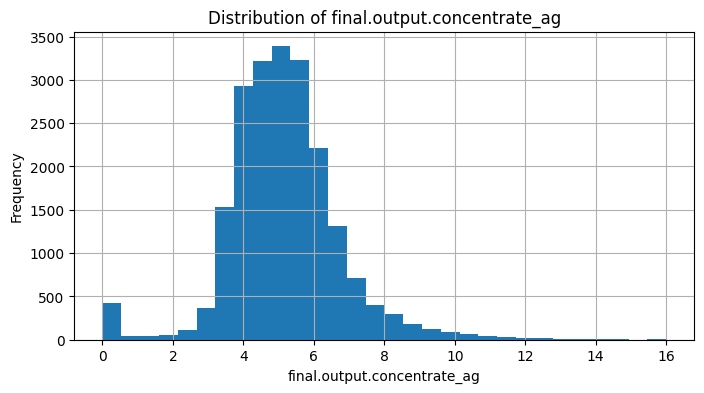

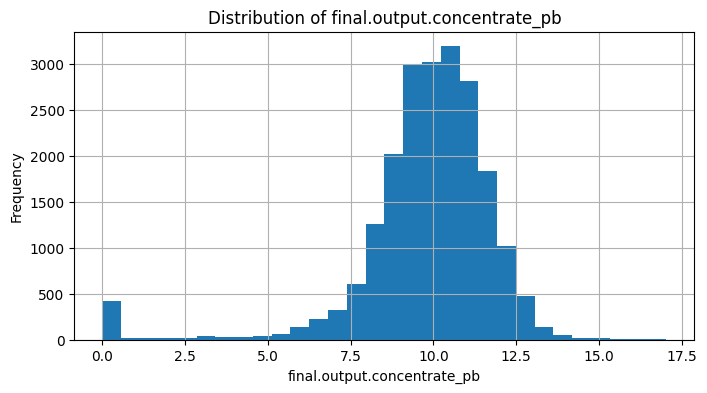

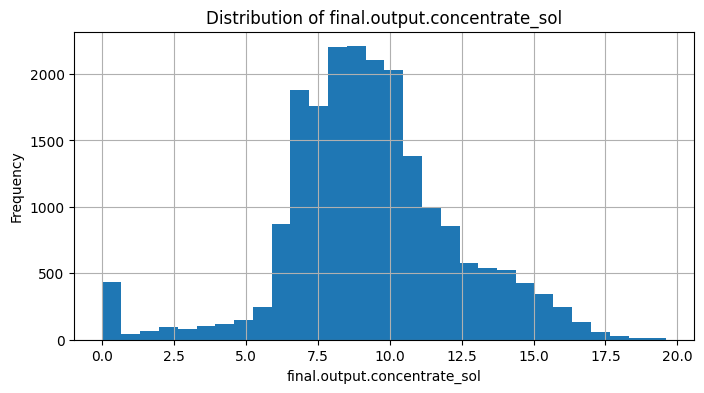

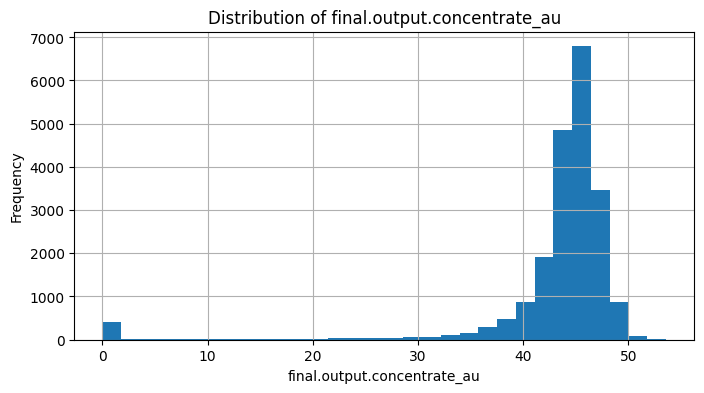

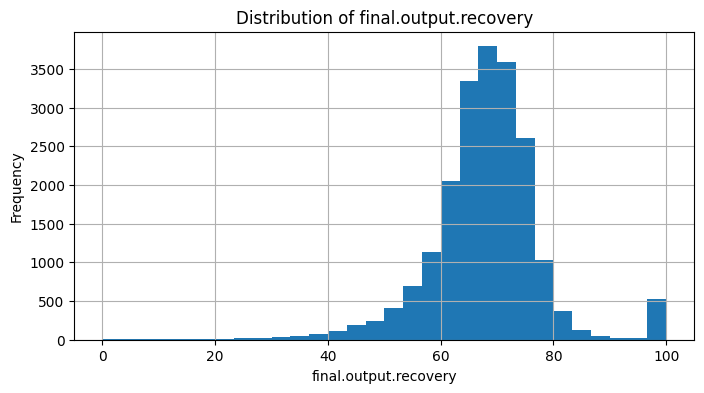

...

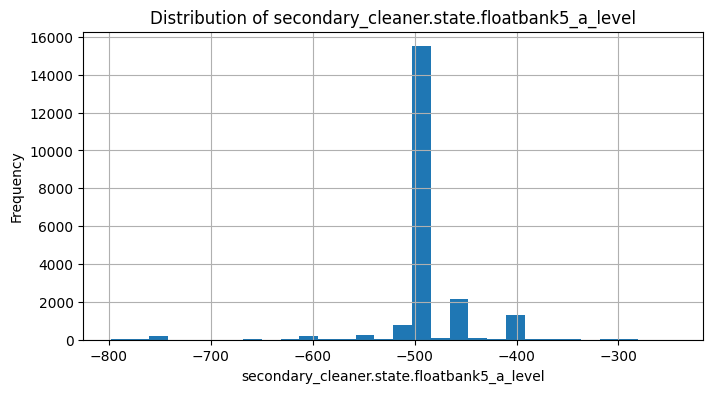

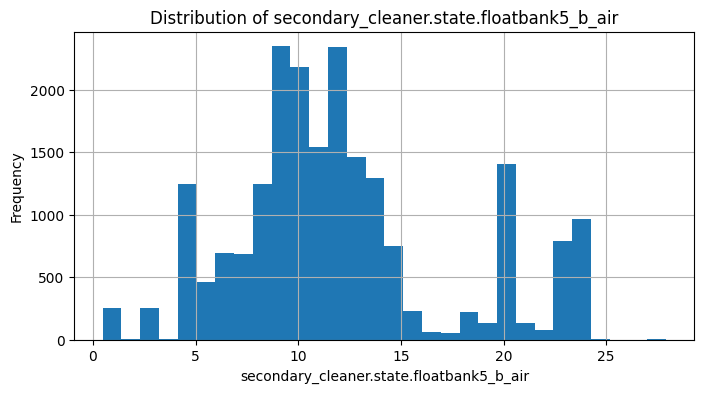

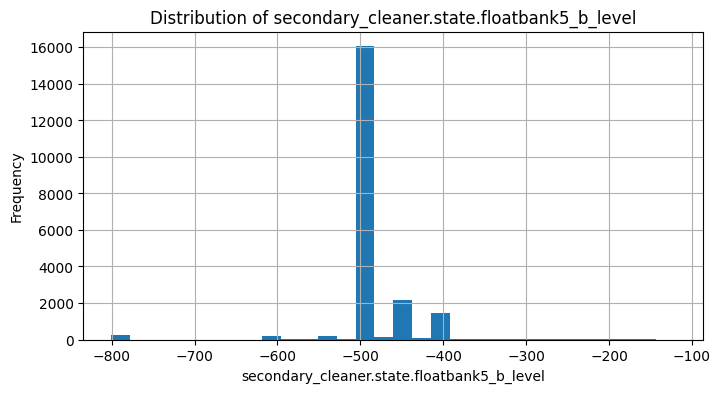

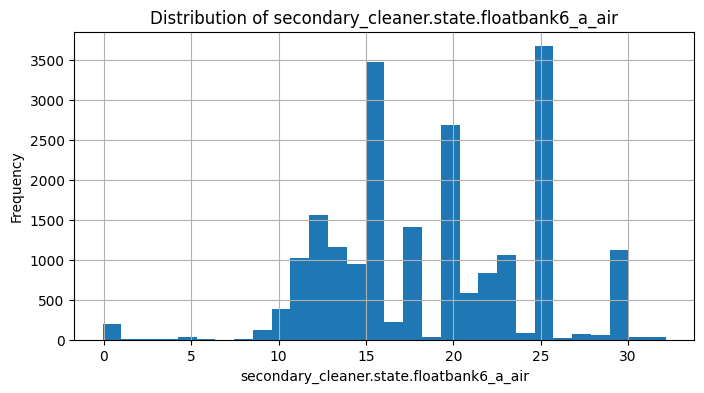

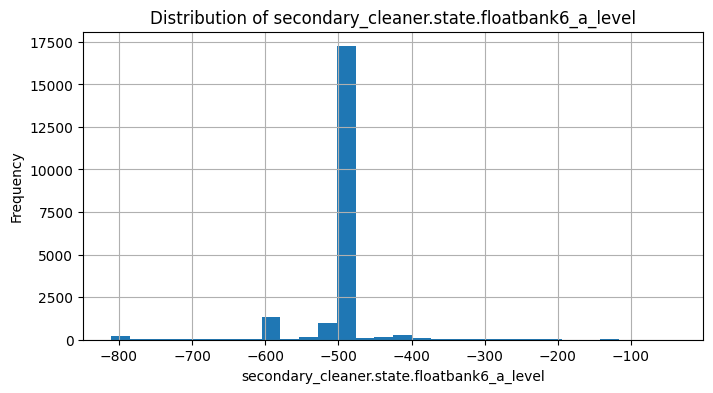

In [40]:
#checking progress
for column in full_set.select_dtypes(include='number').columns:
    plt.figure(figsize=(8, 4))
    full_set[column].hist(bins=30)
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

Now to tackle the gold output tail values

In [41]:
zero_tail_au = full_set[full_set['final.output.tail_au'] == 0]
zero_tail_au

full_set = full_set.drop(zero_tail_au.index, axis=0)

for p3 in zero_tail_au.index :
    if p3 in training_set.index :
        training_set = training_set.drop(p3, axis=0)
for q3 in zero_tail_au.index :    
    if q3 in test_set.index :
        test_set = test_set.drop(q3, axis=0)

full_set

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
date,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,123.819808,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,122.270188,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,117.988169,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-18 06:59:59,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,123.381787,...,23.031497,-501.167942,20.007571,-499.740028,18.006038,-499.834374,13.001114,-500.155694,20.007840,-501.296428
2018-08-18 07:59:59,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,120.878188,...,22.960095,-501.612783,20.035660,-500.251357,17.998535,-500.395178,12.954048,-499.895163,19.968498,-501.041608
2018-08-18 08:59:59,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,105.666118,...,23.015718,-501.711599,19.951231,-499.857027,18.019543,-500.451156,13.023431,-499.914391,19.990885,-501.518452


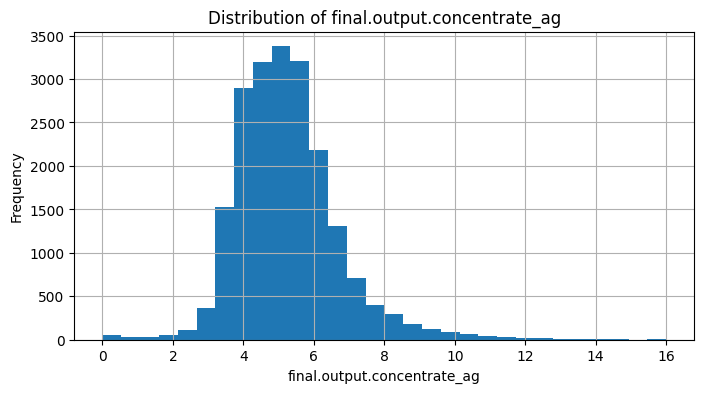

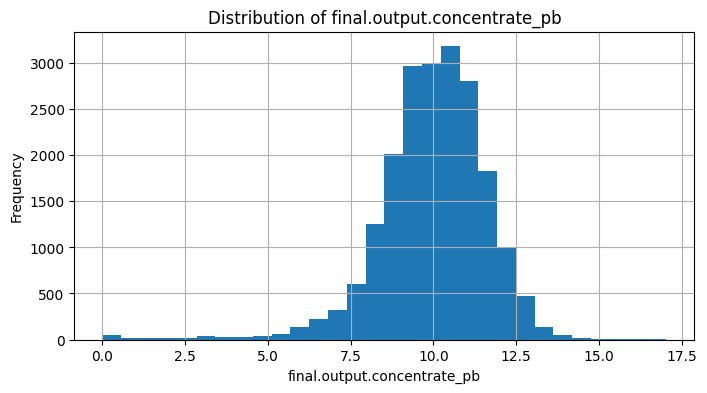

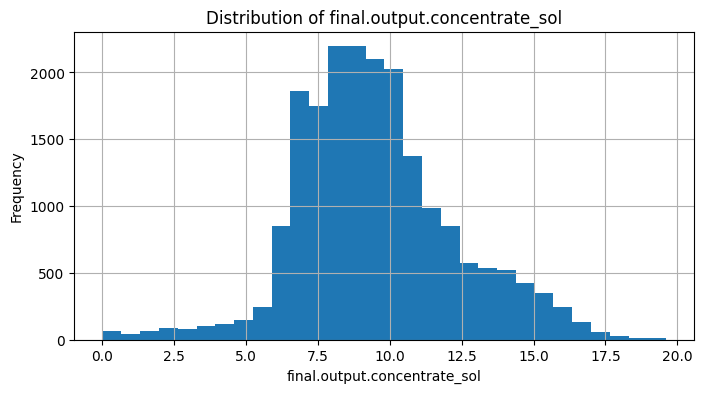

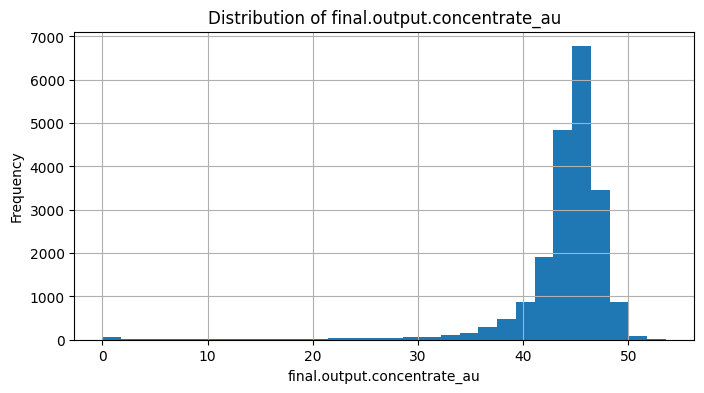

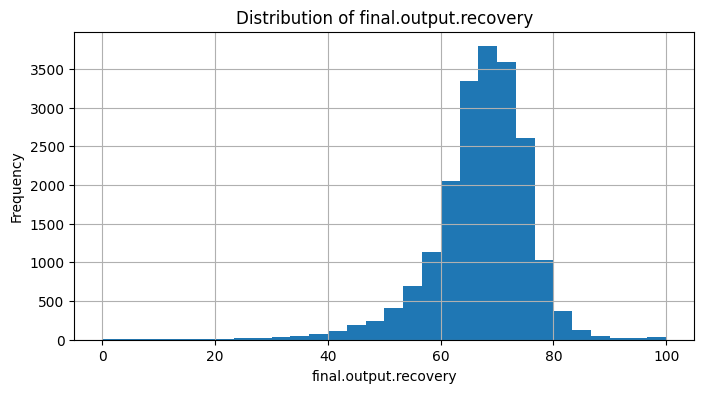

...

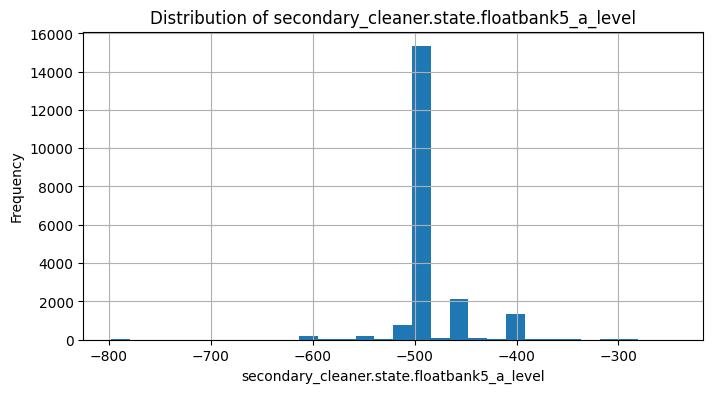

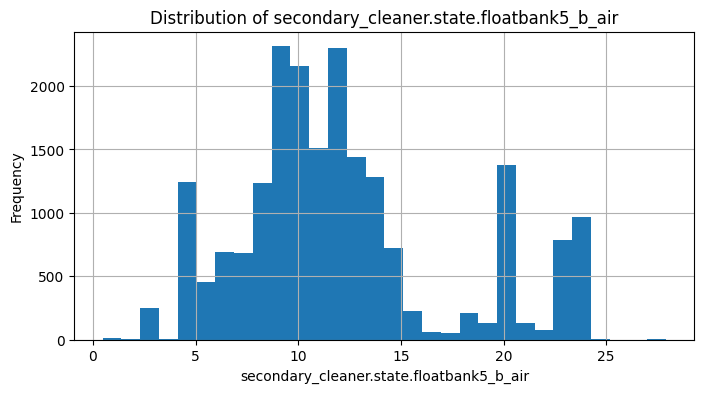

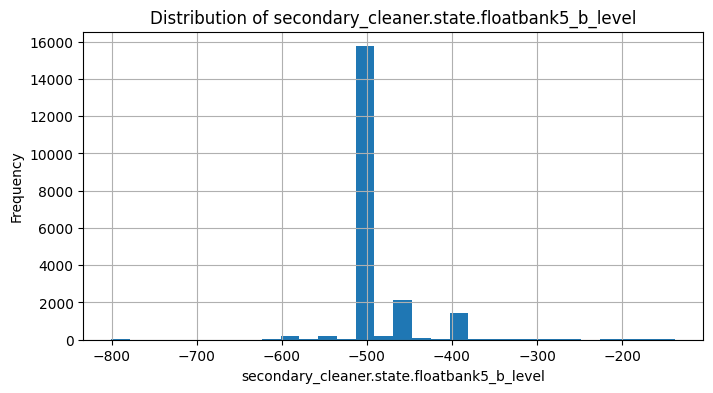

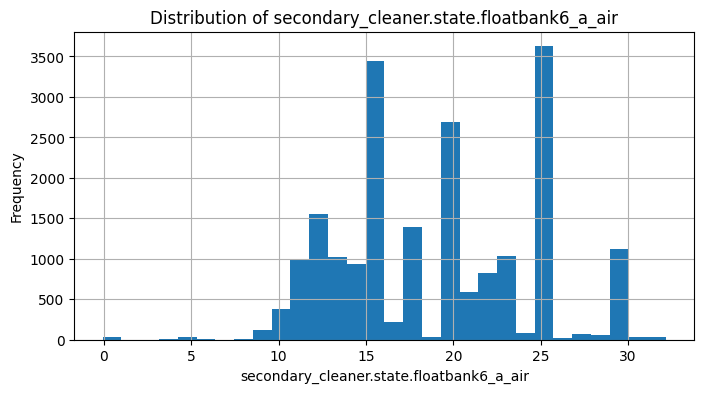

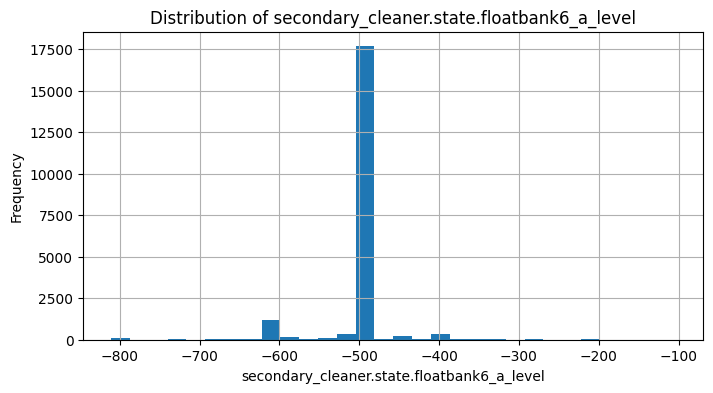

In [ ]:
for column in full_set.select_dtypes(include='number').columns:
    plt.figure(figsize=(8, 4))
    full_set[column].hist(bins=30)
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

<div class="alert alert-block alert-info">

__That should be enough removing to fill in the missing values.__

</div>

In [ ]:
full_set.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 20389 entries, 2016-01-15 00:00:00 to 2018-08-18 10:59:59
Data columns (total 86 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   final.output.concentrate_ag                         20307 non-null  float64
 1   final.output.concentrate_pb                         20309 non-null  float64
 2   final.output.concentrate_sol                        20013 non-null  float64
 3   final.output.concentrate_au                         20310 non-null  float64
 4   final.output.recovery                               20110 non-null  float64
 5   final.output.tail_ag                                20314 non-null  float64
 6   final.output.tail_pb                                20197 non-null  float64
 7   final.output.tail_sol                               20251 non-null  float64
 8   final.output.tail_au                     

Now I need to fill in the missing values based on the column. This will be done with a loop ad conditional statements. If the column distribution is approximately normal, I will use the mean. That criteria is is the median is within 5% of the mean's value. If not, I will consider it to be skewed. Now once this is determined, I will the respective column with the determined value. It will also replace the corresponding values in the training and test sets.

In [ ]:
#creating a for loop that will fill the missing values with either the mean or median depending if the data is approx normal or skewed
for col in full_set.loc[:,'final.output.concentrate_ag':].columns : #don't want the date column
    mean = full_set[col].mean() #calulate mean
    median = full_set[col].median() #calculate median
    if abs(mean - median) < (0.05 * mean) : #if the difference of the mean and median is within 5% of the mean's value i'll consider it approx normal
        full_set[col] = full_set[col].fillna(mean) #fill in with the mean
        if col in test_set.columns:                #if the column is in the test set, fill the test and training set columns with the mean
            test_set[col] = test_set[col].fillna(mean)
            training_set[col] = training_set[col].fillna(mean)
        elif col in training_set.columns:                          #if its not in the test set, at least check if its in the training set
            training_set[col] = training_set[col].fillna(mean)     #if so, fill the training set column with the mean
            
    else:                                   #if not approx normal, it will be considered skewed
        full_set[col] = full_set[col].fillna(median) #fill with median of column
        if col in test_set.columns :                 #if the column is in the test set, fill the test and training set columns with the median
            test_set[col] = test_set[col].fillna(median)
            training_set[col] = training_set[col].fillna(median)
        elif col in training_set.columns:               #if not in the test set, at least check if its in the training set 
            training_set[col] = training_set.fillna(median)

In [ ]:
full_set.info() #checking if they filled in full set

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 20389 entries, 2016-01-15 00:00:00 to 2018-08-18 10:59:59
Data columns (total 86 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   final.output.concentrate_ag                         20389 non-null  float64
 1   final.output.concentrate_pb                         20389 non-null  float64
 2   final.output.concentrate_sol                        20389 non-null  float64
 3   final.output.concentrate_au                         20389 non-null  float64
 4   final.output.recovery                               20389 non-null  float64
 5   final.output.tail_ag                                20389 non-null  float64
 6   final.output.tail_pb                                20389 non-null  float64
 7   final.output.tail_sol                               20389 non-null  float64
 8   final.output.tail_au                     

In [ ]:
training_set.info() #checking if filled in training set

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 15011 entries, 2016-01-15 00:00:00 to 2018-08-18 10:59:59
Data columns (total 86 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   final.output.concentrate_ag                         15011 non-null  float64
 1   final.output.concentrate_pb                         15011 non-null  float64
 2   final.output.concentrate_sol                        15011 non-null  float64
 3   final.output.concentrate_au                         15011 non-null  float64
 4   final.output.recovery                               15011 non-null  float64
 5   final.output.tail_ag                                15011 non-null  float64
 6   final.output.tail_pb                                15011 non-null  float64
 7   final.output.tail_sol                               15011 non-null  float64
 8   final.output.tail_au                     

In [ ]:
test_set.info() #checking if filled in test set

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5378 entries, 2016-09-01 00:59:59 to 2017-12-31 23:59:59
Data columns (total 52 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   primary_cleaner.input.sulfate               5378 non-null   float64
 1   primary_cleaner.input.depressant            5378 non-null   float64
 2   primary_cleaner.input.feed_size             5378 non-null   float64
 3   primary_cleaner.input.xanthate              5378 non-null   float64
 4   primary_cleaner.state.floatbank8_a_air      5378 non-null   float64
 5   primary_cleaner.state.floatbank8_a_level    5378 non-null   float64
 6   primary_cleaner.state.floatbank8_b_air      5378 non-null   float64
 7   primary_cleaner.state.floatbank8_b_level    5378 non-null   float64
 8   primary_cleaner.state.floatbank8_c_air      5378 non-null   float64
 9   primary_cleaner.state.floatbank8_c_level    5378 

Eureka!!! All values filled!

<img src="https://i.pinimg.com/originals/a1/34/8c/a1348c566154d88d3dbbc602a9f8f9a6.gif" alt="Alt text that describes the graphic" title="Title text" />

## Analyze Data

### Concentrations of Metals

To begin with analysis, I will first observe how the concentrations change for each metal throughout the purification process

<span style='color:red'> This is here for my reference </span>

__material flotation process order__

rougher.input.feed_xx

rougher.output.concentrate_xx

primary_cleaner.output.concentrate_xx

final.output.concentrate_xx


__tail output order__

rougher.output.tail_xx

primary_cleaner.output.tail_xx

secondary_cleaner.output.tail_xx

final.output.tail_xx

In [ ]:
#filtering dataset to see only gold concentrations
gold_progress =  full_set[['rougher.input.feed_au','rougher.output.concentrate_au','primary_cleaner.output.concentrate_au','final.output.concentrate_au']]
gold_progress

,rougher.input.feed_au,rougher.output.concentrate_au,primary_cleaner.output.concentrate_au,final.output.concentrate_au
date,,,,
2016-01-15 00:00:00,6.486150,19.793808,34.174427,42.192020
2016-01-15 01:00:00,6.478583,20.050975,34.118526,42.701629
2016-01-15 02:00:00,6.362222,19.737170,33.969464,42.657501
2016-01-15 03:00:00,6.118189,19.320810,28.260743,42.689819
2016-01-15 04:00:00,5.663707,19.216101,33.044932,42.774141
...,...,...,...,...
2018-08-18 06:59:59,5.335862,18.603550,32.940215,46.713954
2018-08-18 07:59:59,4.838619,18.441436,32.925325,46.866780
2018-08-18 08:59:59,4.525061,15.111231,31.856742,46.795691


From just looking here, it appears that the concentration of gold increases as it progresses through the purification process. But since the dataset is very long, to be sure that it always does, I'll make a function that checks.

In [ ]:
def check_increase(row): #define function
    c1 = row['rougher.input.feed_au'] #column1 value
    c2 = row['rougher.output.concentrate_au'] #column2 value
    c3 = row['primary_cleaner.output.concentrate_au'] #column3 value
    c4 = row['final.output.concentrate_au'] #column4 value
    if c1 < c2 < c3 < c4 :
        return True
    else :
        return False

gold_progress['increase'] = gold_progress.apply(check_increase, axis=1) #created column of boolean values

number_of_increase = gold_progress['increase'].sum() #summed the boolean values

percent_of_num_of_inc = (gold_progress['increase'].sum() / len(gold_progress))*100 #checking percentage of all increased rows since not all did

print(f"Number of occurances when each row only increases: {number_of_increase}")
print(f"Percentage of only increases out of all rows: {percent_of_num_of_inc}")

Number of occurances when each row only increases: 18801
Percentage of only increases out of all rows: 92.21148658590417


/tmp/ipykernel_64/95342134.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gold_progress['increase'] = gold_progress.apply(check_increase, axis=1) #created column of boolean values


In [ ]:
gold_progress = gold_progress.drop('increase', axis=1) #dropping added column because I dont need it

<div class="alert alert-block alert-info">
Remember when I was talking about how a particular input doesn't correspond to the other stages in its respective row? Well, I find it very reasonable that the only reason some rows are not all increasing because of a few low inputs that trickled their way through the dataset. With 92% of the rows following the pattern that there's a typical increase throughout the process,

__I find it safe to say that the concentration is ideally supposed to increase from start to finish.__

This makes sense because of the amount of material that enters the system, the ratio of gold to the total material wouldn't be high. As the excess material is removed, it only makes sense that the ratio number should increase no make what unit of measure they are using to denote their concentration.
</div>

In [ ]:
silver_progress = full_set[['rougher.input.feed_ag','rougher.output.concentrate_ag','primary_cleaner.output.concentrate_ag','final.output.concentrate_ag']]
silver_progress

,rougher.input.feed_ag,rougher.output.concentrate_ag,primary_cleaner.output.concentrate_ag,final.output.concentrate_ag
date,,,,
2016-01-15 00:00:00,6.100378,11.500771,8.547551,6.055403
2016-01-15 01:00:00,6.161113,11.615865,8.558743,6.029369
2016-01-15 02:00:00,6.116455,11.695753,8.603505,6.055926
2016-01-15 03:00:00,6.043309,11.915047,7.221879,6.047977
2016-01-15 04:00:00,6.060915,12.411054,9.089428,6.148599
...,...,...,...,...
2018-08-18 06:59:59,6.091855,11.124896,6.559174,3.224920
2018-08-18 07:59:59,6.121323,11.425983,6.612376,3.195978
2018-08-18 08:59:59,5.970515,8.523497,7.128896,3.109998


In [ ]:
lead_progress = full_set[['rougher.input.feed_pb','rougher.output.concentrate_pb','primary_cleaner.output.concentrate_pb','final.output.concentrate_pb']]
lead_progress

,rougher.input.feed_pb,rougher.output.concentrate_pb,primary_cleaner.output.concentrate_pb,final.output.concentrate_pb
date,,,,
2016-01-15 00:00:00,2.284912,7.101074,10.389648,9.889648
2016-01-15 01:00:00,2.266033,7.278807,10.497069,9.968944
2016-01-15 02:00:00,2.159622,7.216833,10.354494,10.213995
2016-01-15 03:00:00,2.037807,7.175616,8.496563,9.977019
2016-01-15 04:00:00,1.786875,7.240205,9.986786,10.142511
...,...,...,...,...
2018-08-18 06:59:59,4.617558,10.984003,12.445966,11.356233
2018-08-18 07:59:59,4.144989,10.888213,12.623947,11.349355
2018-08-18 08:59:59,4.020002,8.955135,12.633558,11.434366


These two are a little tricky. From the condensed datasets, I see that, generally, the concentration of silver increases, then decreases twice. I also see that, in general, the lead concentration increased twice then decreased.
My best interpretation of this is that the first flotation stage removes mostly other parts of the ore that is not metal. The first stage of the cleaner process may involve removing silver. Then the second stage of the cleaner process involves removing lead. Even if that was not the intent of those stages, it could be a indirect result. To get a better grasp, I'll observe the values of the tail columns

<span style='color:blue'> If my hypothesis is correct, the tail values for silver should have the largest increase right after the first stage of cleaning process. For the lead, it should have the largest increase after the second stage of the cleaning process. </span>

I'll look at the tail values of gold, then silver, lastly lead

In [ ]:
gold_tail_progress = full_set[['rougher.output.tail_au', 'primary_cleaner.output.tail_au', 'secondary_cleaner.output.tail_au', 'final.output.tail_au']]
gold_tail_progress

,rougher.output.tail_au,primary_cleaner.output.tail_au,secondary_cleaner.output.tail_au,final.output.tail_au
date,,,,
2016-01-15 00:00:00,1.170244,2.106679,2.606185,2.143149
2016-01-15 01:00:00,1.184827,2.353017,2.488248,2.224930
2016-01-15 02:00:00,1.162562,2.416800,2.458187,2.257889
2016-01-15 03:00:00,1.079755,2.262051,2.322062,2.146849
2016-01-15 04:00:00,1.012642,2.277073,2.330448,2.055292
...,...,...,...,...
2018-08-18 06:59:59,0.748633,2.314352,0.000000,1.529220
2018-08-18 07:59:59,0.771582,2.462890,0.000000,1.612542
2018-08-18 08:59:59,0.685059,2.612231,0.000000,1.596616


So it appears the amount of gold in the tail output increases slightly after the flotation process then stays roughly consistant afterwards. The initial increase is surely the imperfection of the cleaning process.

Next, Silver

In [ ]:
silver_tail_progress = full_set[['rougher.output.tail_ag', 'primary_cleaner.output.tail_ag', 'secondary_cleaner.output.tail_ag', 'final.output.tail_ag']]
silver_tail_progress

,rougher.output.tail_ag,primary_cleaner.output.tail_ag,secondary_cleaner.output.tail_ag,final.output.tail_ag
date,,,,
2016-01-15 00:00:00,5.008018,14.936526,14.500184,10.411962
2016-01-15 01:00:00,4.955378,16.250511,14.265474,10.462676
2016-01-15 02:00:00,4.843460,16.491823,14.115662,10.507046
2016-01-15 03:00:00,4.655288,16.024359,13.732071,10.422762
2016-01-15 04:00:00,4.552800,16.480185,14.079996,10.360302
...,...,...,...,...
2018-08-18 06:59:59,4.207261,22.854592,0.000000,8.769645
2018-08-18 07:59:59,4.177943,23.002490,0.000000,8.897321
2018-08-18 08:59:59,4.050010,22.298149,0.000000,8.529606


My hypothesis was correct. I do not like those zero values there, but I am willing to ignore those since I removed so many earlier.

Lastly, lead

In [ ]:
lead_tail_progress = full_set[['rougher.output.tail_pb', 'primary_cleaner.output.tail_pb', 'secondary_cleaner.output.tail_pb', 'final.output.tail_pb']]
lead_tail_progress

,rougher.output.tail_pb,primary_cleaner.output.tail_pb,secondary_cleaner.output.tail_pb,final.output.tail_pb
date,,,,
2016-01-15 00:00:00,0.508728,2.534912,4.694824,0.895447
2016-01-15 01:00:00,0.536689,3.049646,4.592547,0.927452
2016-01-15 02:00:00,0.546416,3.124664,4.624775,0.953716
2016-01-15 03:00:00,0.542525,2.960362,4.482453,0.883763
2016-01-15 04:00:00,0.515438,3.112100,4.470737,0.792826
...,...,...,...,...
2018-08-18 06:59:59,0.612935,6.531541,0.000000,3.141541
2018-08-18 07:59:59,0.650557,6.629725,0.000000,3.130493
2018-08-18 08:59:59,0.636095,6.278250,0.000000,2.911418


It appears my hypothesis was incorrect here. But all in all, we can see that there was a decent increase after the primary cleaner stage.

### Compare Feed Particle Sizes

In [ ]:
training_set.info() #recalling names of columns

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 15011 entries, 2016-01-15 00:00:00 to 2018-08-18 10:59:59
Data columns (total 86 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   final.output.concentrate_ag                         15011 non-null  float64
 1   final.output.concentrate_pb                         15011 non-null  float64
 2   final.output.concentrate_sol                        15011 non-null  float64
 3   final.output.concentrate_au                         15011 non-null  float64
 4   final.output.recovery                               15011 non-null  float64
 5   final.output.tail_ag                                15011 non-null  float64
 6   final.output.tail_pb                                15011 non-null  float64
 7   final.output.tail_sol                               15011 non-null  float64
 8   final.output.tail_au                     

In [ ]:
test_set.info() #recalling column names

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5378 entries, 2016-09-01 00:59:59 to 2017-12-31 23:59:59
Data columns (total 52 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   primary_cleaner.input.sulfate               5378 non-null   float64
 1   primary_cleaner.input.depressant            5378 non-null   float64
 2   primary_cleaner.input.feed_size             5378 non-null   float64
 3   primary_cleaner.input.xanthate              5378 non-null   float64
 4   primary_cleaner.state.floatbank8_a_air      5378 non-null   float64
 5   primary_cleaner.state.floatbank8_a_level    5378 non-null   float64
 6   primary_cleaner.state.floatbank8_b_air      5378 non-null   float64
 7   primary_cleaner.state.floatbank8_b_level    5378 non-null   float64
 8   primary_cleaner.state.floatbank8_c_air      5378 non-null   float64
 9   primary_cleaner.state.floatbank8_c_level    5378 

<AxesSubplot:title={'center':'Training Set Input Feed Size'}, ylabel='Frequency'>

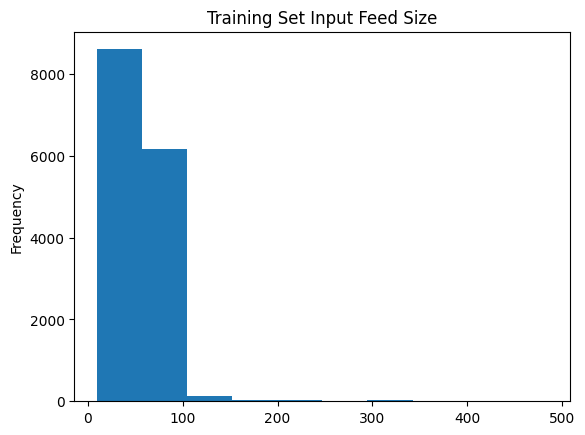

In [ ]:
#creating histogram of feed particle size
training_set['rougher.input.feed_size'].plot(kind='hist', title='Training Set Input Feed Size', xlabel='Units')

<AxesSubplot:title={'center':'Test Set Input Feed Size'}, ylabel='Frequency'>

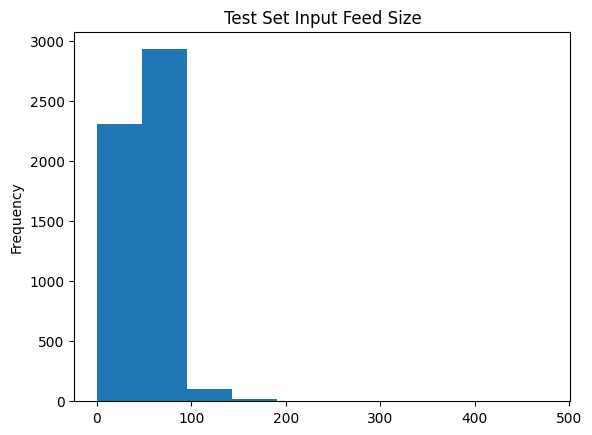

In [ ]:
#creating histogram of feed particle size
test_set['rougher.input.feed_size'].plot(kind='hist', title='Test Set Input Feed Size', xlabel='Units')

### Total Concentrations

Analyzing the total concentrations at different stages

In [ ]:
full_set.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 20389 entries, 2016-01-15 00:00:00 to 2018-08-18 10:59:59
Data columns (total 86 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   final.output.concentrate_ag                         20389 non-null  float64
 1   final.output.concentrate_pb                         20389 non-null  float64
 2   final.output.concentrate_sol                        20389 non-null  float64
 3   final.output.concentrate_au                         20389 non-null  float64
 4   final.output.recovery                               20389 non-null  float64
 5   final.output.tail_ag                                20389 non-null  float64
 6   final.output.tail_pb                                20389 non-null  float64
 7   final.output.tail_sol                               20389 non-null  float64
 8   final.output.tail_au                     

In [ ]:
#three individual functions that will sum the concentrates of each metal at the three indicated stages

def total_output_concentrate(row):
    output_concentrate = row['rougher.output.concentrate_au'] + row['rougher.output.concentrate_ag'] + row['rougher.output.concentrate_pb']
    return output_concentrate

def total_cleaner_concentrate(row):
    cleaner_concentrate = row['primary_cleaner.output.concentrate_au'] + row['primary_cleaner.output.concentrate_ag'] + row['primary_cleaner.output.concentrate_pb']
    return cleaner_concentrate

def total_final_concentrate(row):
    final_concentrate = row['final.output.concentrate_au'] + row['final.output.concentrate_ag'] + row['final.output.concentrate_pb']
    return final_concentrate

In [ ]:
#using apply method to create new columns of the summed values
full_set['total.rougher.output.concentrate_metal'] = full_set.apply(total_output_concentrate, axis=1)
full_set['total.primary_cleaner.output.concentrate_metal'] = full_set.apply(total_cleaner_concentrate, axis=1)
full_set['total.final.output.concentrate_metal'] = full_set.apply(total_final_concentrate, axis=1)

full_set #checking if the columns are there

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,total.rougher.output.concentrate_metal,total.primary_cleaner.output.concentrate_metal,total.final.output.concentrate_metal
date,,,,,,,,,,,,,,,,,,,,,
2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,127.092003,...,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980,38.395653,53.111627,58.137072
2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,125.629232,...,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184,38.945647,53.174338,58.699942
2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,123.819808,...,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363,38.649756,52.927464,58.927421
2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,122.270188,...,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129,38.411473,43.979185,58.714815
2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,117.988169,...,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691,38.867359,52.121146,59.065251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-18 06:59:59,3.224920,11.356233,6.803482,46.713954,73.755150,8.769645,3.141541,10.403181,1.529220,123.381787,...,-499.740028,18.006038,-499.834374,13.001114,-500.155694,20.007840,-501.296428,40.712449,51.945355,61.295107
2018-08-18 07:59:59,3.195978,11.349355,6.862249,46.866780,69.049291,8.897321,3.130493,10.549470,1.612542,120.878188,...,-500.251357,17.998535,-500.395178,12.954048,-499.895163,19.968498,-501.041608,40.755632,52.161648,61.412113
2018-08-18 08:59:59,3.109998,11.434366,6.886013,46.795691,67.002189,8.529606,2.911418,11.115147,1.596616,105.666118,...,-499.857027,18.019543,-500.451156,13.023431,-499.914391,19.990885,-501.518452,32.589863,51.619196,61.340054


In [ ]:
#filtered the full set with only the total concentrations
total_concentrations = full_set[['total.rougher.output.concentrate_metal','total.primary_cleaner.output.concentrate_metal','total.final.output.concentrate_metal']]
total_concentrations

,total.rougher.output.concentrate_metal,total.primary_cleaner.output.concentrate_metal,total.final.output.concentrate_metal
date,,,
2016-01-15 00:00:00,38.395653,53.111627,58.137072
2016-01-15 01:00:00,38.945647,53.174338,58.699942
2016-01-15 02:00:00,38.649756,52.927464,58.927421
2016-01-15 03:00:00,38.411473,43.979185,58.714815
2016-01-15 04:00:00,38.867359,52.121146,59.065251
...,...,...,...
2018-08-18 06:59:59,40.712449,51.945355,61.295107
2018-08-18 07:59:59,40.755632,52.161648,61.412113
2018-08-18 08:59:59,32.589863,51.619196,61.340054


From this view, it looks like the total concentration always increases throughout the purification process. I will verify this just like I did fore with gold concentration by using a function to check.

In [ ]:
def check_increase2(row): #define function
    col1 = row['total.rougher.output.concentrate_metal'] #column1 value
    col2 = row['total.primary_cleaner.output.concentrate_metal'] #column2 value
    col3 = row['total.final.output.concentrate_metal'] #column3 value
    if col1 < col2 < col3 :
        return True
    else :
        return False

total_concentrations['increase'] = total_concentrations.apply(check_increase2, axis=1) #created column of boolean values

number_of_increase_total = total_concentrations['increase'].sum() #summed the boolean values

percent_of_num_of_inc_total = (total_concentrations['increase'].sum() / len(total_concentrations))*100 #checking percentage of all increased rows since not all did

print(f"Number of occurances when each row only increases: {number_of_increase_total}")
print(f"Percentage of only increases out of all rows: {percent_of_num_of_inc_total}")

Number of occurances when each row only increases: 18993
Percentage of only increases out of all rows: 93.15317082740694


/tmp/ipykernel_64/13705252.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  total_concentrations['increase'] = total_concentrations.apply(check_increase2, axis=1) #created column of boolean values


Similar to my explanation about why the gold concentration did not always increase, each row does not contain corresponding input, output, and intermediate values. It is possible a very low input exists and trickled down the dataset and just to happened to naturally have lower values compared to a higher input at certain times. The high precentage of 93% lets me know I am safe to assume that ideally, the total concentration is supposed to increase.

In [ ]:
total_concentrations = total_concentrations.drop('increase', axis=1) #dropping added column because I dont need it anymore

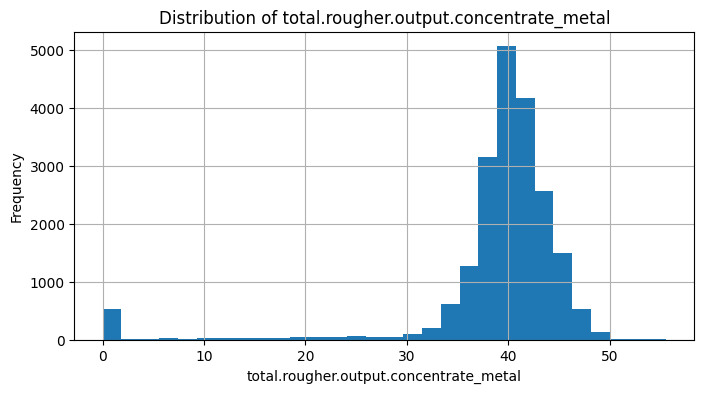

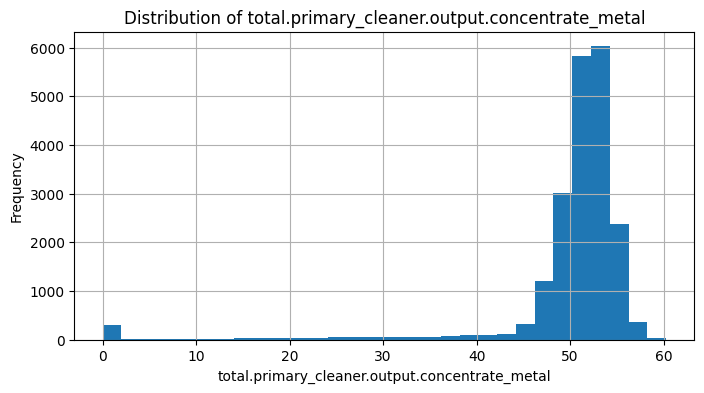

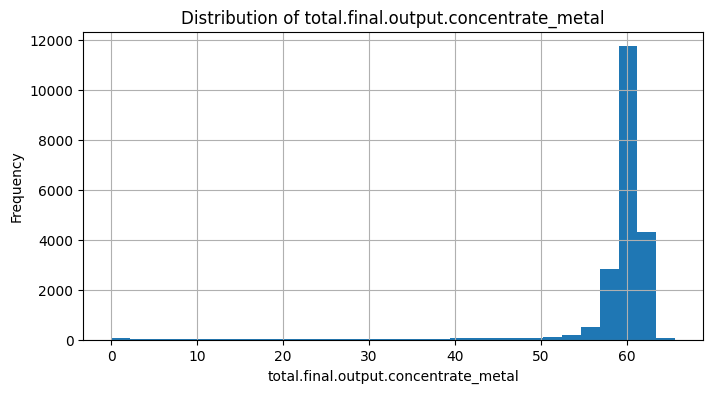

In [ ]:
for column in total_concentrations.select_dtypes(include='number').columns:
    plt.figure(figsize=(8, 4))
    full_set[column].hist(bins=30)
    plt.title(f"Distribution of {column}")
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

It appears each distribution of the total concentrations are all left skewed. There are some slight influxes of low values close to zero but that is ok. The data is already left skewed. The median can still be used as a central value if needed.

## Creating Models

### Calculate sMAPE

I shall create a function that calculates symmetric Mean Absolute Percentage Error (sMAPE)

In [ ]:
def smape(targ, pred): #defined function that takes two equal length series
    difference = abs(targ - pred)                       #difference of target values and predicted values
    abs_targ = abs(targ)                                #absolute value of target values
    abs_pred = abs(pred)                                #absolute value of predicted values
    quotient = difference / ((abs_targ + abs_pred) / 2) #quotient of difference and the average of absolute values of target and predictions
    summation = quotient.sum()                          #sum all the values
    average = summation / len(targ)                     #divide by total number of values
    percentage = average * 100                          #multiply by 100 for percentage
    return percentage

def final_smape(rougher, final): #defined function that takes 2 sMAPE values
    rough25 = rougher * 0.25     #25% of the rougher
    final75 = final * 0.75       #75% of the final
    combined = rough25 + final75 #add them together
    return combined

In [ ]:
#testing functions with test series
series1 = pd.Series([1, -2, 3, 4, 4, 3, 2, 1])
series2 = pd.Series([2, 3, 4, 5, 5, 4, -3, 2])
series3 = pd.Series([0, -1, 2, 3, 3, 2, 1, 0])
series4 = pd.Series([1, 1, 1, 1, 1, 1, -1, 1])

smape1 = smape(series1, series2)
smape2 = smape(series3, series4)

final_smape(smape1, smape2)

126.09126984126985

### Training Models

In [ ]:
#info for reference
test_set.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5378 entries, 2016-09-01 00:59:59 to 2017-12-31 23:59:59
Data columns (total 52 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   primary_cleaner.input.sulfate               5378 non-null   float64
 1   primary_cleaner.input.depressant            5378 non-null   float64
 2   primary_cleaner.input.feed_size             5378 non-null   float64
 3   primary_cleaner.input.xanthate              5378 non-null   float64
 4   primary_cleaner.state.floatbank8_a_air      5378 non-null   float64
 5   primary_cleaner.state.floatbank8_a_level    5378 non-null   float64
 6   primary_cleaner.state.floatbank8_b_air      5378 non-null   float64
 7   primary_cleaner.state.floatbank8_b_level    5378 non-null   float64
 8   primary_cleaner.state.floatbank8_c_air      5378 non-null   float64
 9   primary_cleaner.state.floatbank8_c_level    5378 

__I am going to establish the features and targets for the models I wil be training. Of all the columns in the test set, most of them are not necessary. I only need to use the columns that begin with "rougher" because those are the values that can be recorded prior to the purification process.__

In [ ]:
#creating a list of the columns that I deemded necessary as features for the models
features_list = ['rougher.input.feed_ag','rougher.input.feed_pb','rougher.input.feed_rate','rougher.input.feed_size','rougher.input.feed_sol','rougher.input.feed_au','rougher.input.floatbank10_sulfate','rougher.input.floatbank10_xanthate','rougher.input.floatbank11_sulfate','rougher.input.floatbank11_xanthate','rougher.state.floatbank10_a_air','rougher.state.floatbank10_a_level','rougher.state.floatbank10_b_air','rougher.state.floatbank10_b_level','rougher.state.floatbank10_c_air','rougher.state.floatbank10_c_level','rougher.state.floatbank10_d_air','rougher.state.floatbank10_d_level','rougher.state.floatbank10_e_air','rougher.state.floatbank10_e_level','rougher.state.floatbank10_f_air','rougher.state.floatbank10_f_level']
targets_list = ['rougher.output.recovery','final.output.recovery'] #list of the desired targets

features = training_set[features_list] #features set to variable
targets = training_set[targets_list] #targets set to variable

features_train, features_valid, targets_train, targets_valid = train_test_split(features, targets, test_size=0.25, random_state=616)

The data here is all numeric. Therefore all models will be regression models.
I will be training a decision tree, a random forest, and a linear regression. However, since I need to predict two target values instead of one, I will be using the MultiOutputRegressor to complete this task rather than training and predicting twice. The multi-output seems more intuitive because I want the two predicted targets to be determined from the same criteria.

#### Decision Tree

In [ ]:
best_model_dt = None
best_result_dt = 50 #Just picking 50 even though we are shooting for a very low percentage
best_depth = 0
for depth in range(1,7):
    model_dt = MultiOutputRegressor(DecisionTreeRegressor(random_state=616, max_depth=depth))
    model_dt.fit(features_train, targets_train)
    predictions_valid = model_dt.predict(features_valid)
    smape_result = final_smape(smape(targets_valid['rougher.output.recovery'], predictions_valid[:,0]), smape(targets_valid['final.output.recovery'], predictions_valid[:,1]))
    if smape_result < best_result_dt :
        best_model = model_dt
        best_result = smape_result
        best_depth = depth

print(f"Best sMAPE Result: {best_result}")
print(f"Best Tree Depth: {best_depth}")

Best sMAPE Result: 8.521156052633174
Best Tree Depth: 6


Alright less than 10%! A sMAPE value of about 9.4% from using a tree depth of 6. I don't want to go above 6 because that will put me at risk of overfitting. Now let's explore the other models to see if we can aquire a better result.

#### Random Forest

In [ ]:
best_model_rf = None
best_result_rf = 50
best_est = 0
best_depth_rf = 0
for est in range(10, 51, 10):
    for depth in range(1,11):
        model_rf = MultiOutputRegressor(RandomForestRegressor(random_state=616, n_estimators=est, max_depth=depth))
        model_rf.fit(features_train, targets_train)
        predictions_valid_rf = model_rf.predict(features_valid)
        smape_result_rf = final_smape(smape(targets_valid['rougher.output.recovery'], predictions_valid_rf[:,0]), smape(targets_valid['final.output.recovery'], predictions_valid_rf[:,1]))
        if smape_result_rf < best_result :
            best_result_rf = smape_result_rf
            best_est = est
            best_depth_rf = depth

print(f"Best sMAPE Result: {best_result_rf}")
print(f"Best Number of Estimators: {best_est}")
print(f"Best Tree Depth: {best_depth_rf}")

Best sMAPE Result: 7.477954176485992
Best Number of Estimators: 50
Best Tree Depth: 10


We brought the sMAPE value down to about 8.5% by using 50 estimators and a tree depth of 10. One more model to try so let's hope we can beat this.

#### Linear Regression

In [ ]:
model_lr = MultiOutputRegressor(LinearRegression())
model_lr.fit(features_train, targets_train)
predictions_valid_lr = model_lr.predict(features_valid)

smape_result_lr = final_smape(smape(targets_valid['rougher.output.recovery'], predictions_valid_lr[:,0]), smape(targets_valid['final.output.recovery'], predictions_valid_lr[:,1]))

print(f"sMAPE Result: {smape_result_lr}")

sMAPE Result: 8.898440142462409


Ahh a sMAPE value of about 10.8%. Not better than the random forest result

### Using Model on Test Set

It appears that the best model is a Random Forest with 50 esitmators and a tree depth of 10. I shall be using that for the test set.

First I am going to set the datetimes to be the indices of both the full set and the test set. From there, I'll be able to match the rows by filtering the full set using the index of the test set. That will allow me to test the model on the test set and compare the predicted values to the actual target values.

In [ ]:
#filtering full set to match the test set indices
full_set_test = full_set[full_set.index.isin(test_set.index)]
full_set_test

,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,...,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,total.rougher.output.concentrate_metal,total.primary_cleaner.output.concentrate_metal,total.final.output.concentrate_metal
date,,,,,,,,,,,,,,,,,,,,,
2016-09-01 00:59:59,7.578381,10.466295,11.990938,40.743891,70.273583,12.688885,3.844413,11.075686,4.537988,210.800909,...,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414,46.147906,52.703628,58.788566
2016-09-01 01:59:59,7.813838,10.581152,12.216172,39.604292,68.910432,12.829171,3.918901,11.132824,4.675117,215.392455,...,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438,46.914165,51.325154,57.999282
2016-09-01 02:59:59,7.623392,10.424024,12.313710,40.724190,68.143213,12.977846,4.026561,10.990134,4.828907,215.259946,...,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559,45.489926,51.585010,58.771605
2016-09-01 03:59:59,8.552457,10.503229,13.074570,39.290997,67.776393,12.451947,3.780702,11.155935,4.969620,215.336236,...,-499.474407,7.897085,-500.868509,4.931400,-499.963623,24.948919,-498.709987,46.559998,52.333093,58.346683
2016-09-01 04:59:59,8.078781,10.222788,12.475427,40.254524,61.467078,11.827846,3.632272,11.403663,5.256806,199.099327,...,-500.397500,8.107890,-509.526725,4.957674,-500.360026,25.003331,-500.856333,46.269598,54.658400,58.556092
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-31 19:59:59,5.000174,9.710255,10.845459,46.400415,68.919891,13.944836,3.373224,13.766506,3.890235,173.957757,...,-499.673279,7.977259,-499.516126,5.933319,-499.965973,8.987171,-499.755909,38.135730,52.032789,61.110844
2017-12-31 20:59:59,4.956679,9.727962,9.705617,46.657393,68.440582,12.624143,2.974607,14.177795,3.809054,172.910270,...,-499.122723,9.288553,-496.892967,7.372897,-499.942956,8.986832,-499.903761,38.033529,52.305084,61.342034
2017-12-31 21:59:59,4.779534,9.818943,8.255551,47.337296,67.092759,12.134647,2.843604,13.219960,3.909903,171.135718,...,-499.936252,10.989181,-498.347898,9.020944,-500.040448,8.982038,-497.789882,40.352936,53.494939,61.935774


In [ ]:
features_final = test_set[features_list]
targets_final = full_set_test[targets_list]

final_model = MultiOutputRegressor(RandomForestRegressor(random_state=616, n_estimators=50, max_depth=10))
final_model.fit(features_train, targets_train)
predictions_final = final_model.predict(features_final)

smape_result_final = final_smape(smape(targets_final['rougher.output.recovery'], predictions_final[:,0]), smape(targets_final['final.output.recovery'], predictions_final[:,1]))

print(f"Final sMAPE Result: {smape_result_final}")

Final sMAPE Result: 8.95802545508031


Well I find this to be a success because the sMAPE value is under 10%. After this project, Zyfra should use a Random Forest Regression model with 50 estimators and a tree depth of 10 to predict there recovery 